In [104]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Libraries Import and Data Exploration

In [105]:
%%capture
!sudo apt install tesseract-ocr
!pip install pytesseract
import pytesseract
import cv2
from matplotlib import pyplot as plt
import os
import numpy as np
import matplotlib.pyplot as plt
!pip install paddleocr
!pip install paddlepaddle -f https://www.paddlepaddle.org.cn/whl/quick_install.html
from paddleocr import PaddleOCR, draw_ocr
import re
import pandas as pd
from datetime import datetime
from google.colab.patches import cv2_imshow
import math
import difflib

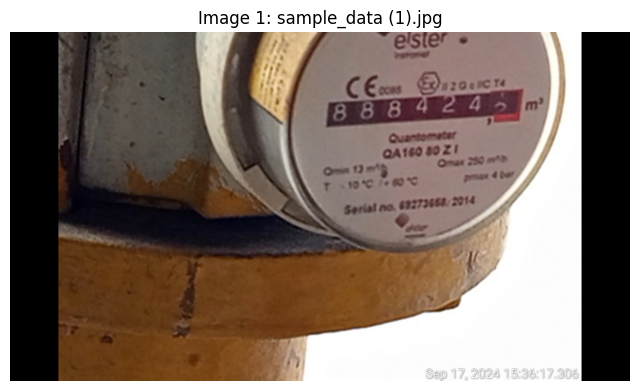

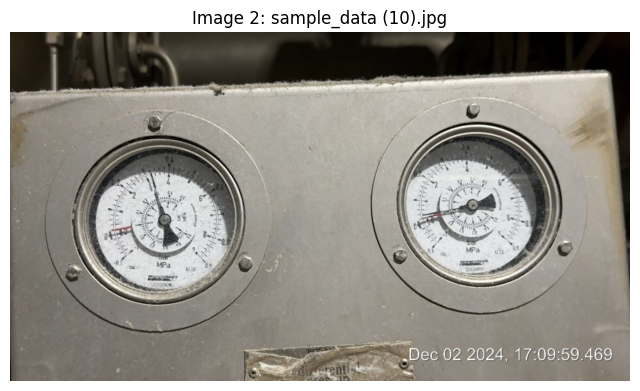

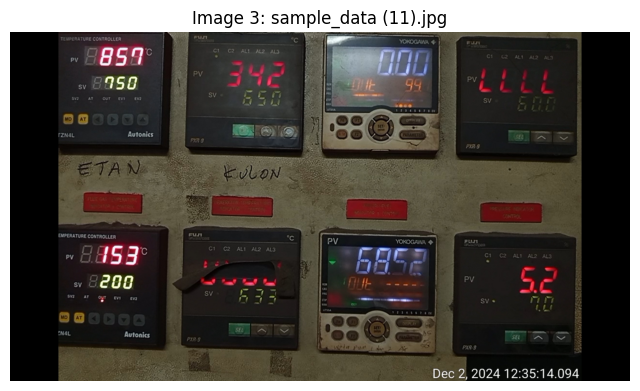

In [106]:
# load file and show image
folder_path = '/content/drive/MyDrive/sample_data'
image_files = sorted(os.listdir(folder_path))

# show 3 images
for i, img_file in enumerate(image_files[:3]):
    img_path = os.path.join(folder_path, img_file)
    img = cv2.imread(img_path)

    plt.figure(figsize=(8, 5))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Image {i+1}: {img_file}")
    plt.axis('off')
    plt.show()

I found that there're 5 types of dashboard, in each type, has the same dashboard but different information:

First: (1) (7)

Second: (2) (3) (8)

Third: (4) (6) (15)

Forth: (5) (9) (11) (12) (13) (14)

Fifth: (10)

So I decide to build a code template for each type. The basic idea is to proceed code on the first image of each type, then try out if the code is reusable on other images in this type.

In this 'Data Extracting Assessment-2', I'll focus on Third Type (4), (6), (15)

# Third Type: (4) (6) (15)

It's a flow meter, so I think the important values for this dashboard are current total flow and timestamp.

So I will build code template based on sample_data (4), then reuse it on sample_data (6) (15). If the template cannot work on other sample_data, I'll modify the code.

For current total flow, because it has four parts, one is the digital number, the other three are the circular dial numbers. So I'll start at the digital number, then extract the circular dial numbers, finally combine them together.

Current total flow=current total flow_1+ 0.1 *current total flow_2+0.01 *current total flow_3+0.001 *current total flow_4

For third type dashboard data extraction, it follows 6 main steps:

Step 1: current total flow_1, extract the digital number

Step 2:  current total flow_2, extractthe *0.1 circular dial

Step3: current total flow_3, extract the *0.01 circular dial

Step 4: current total flow_4, extract the *0.001 circular dial

Step 5: Extract timestamp

Step 6: Output in csv and annoted image

## sample_data (4)

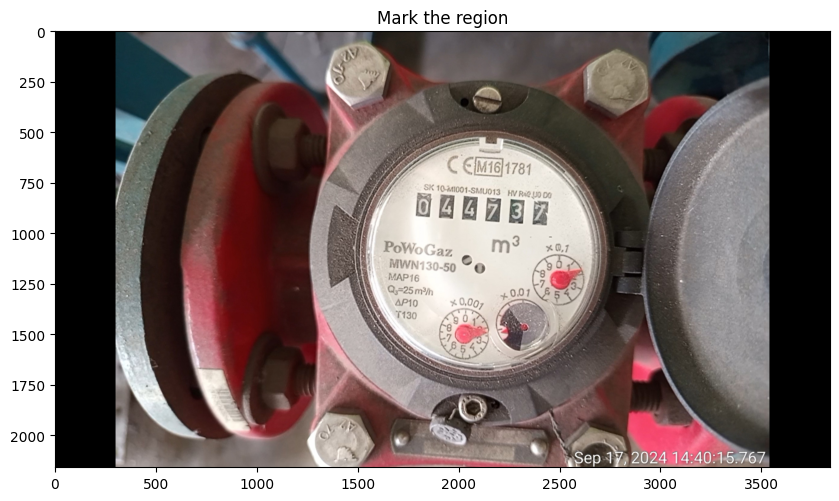

In [245]:
# Show image with oordinate axis
img4 = cv2.imread('/content/drive/MyDrive/sample_data/sample_data (4).jpg')
img_rgb = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,8))
plt.imshow(img_rgb)
plt.title('Mark the region')
plt.show()

### Step 1: Current Total Flow_1



#### Extract and Rotate
Because it's hard to recognize image which is skewed, so need to rotate the image to horizonal line.

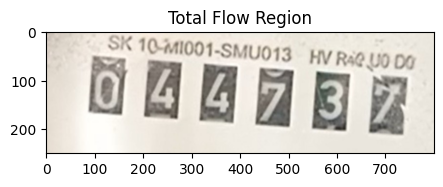

In [246]:
# Roughly extract from original image
totalflow_region_1 = img4[750:1000, 1700:2500]

totalflow_rgb = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

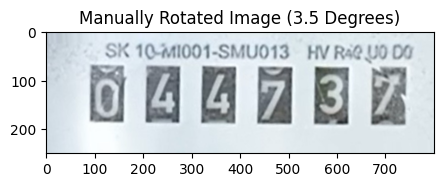

In [247]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_1, 3.5)

plt.figure(figsize=(5, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (3.5 Degrees)')
plt.show()

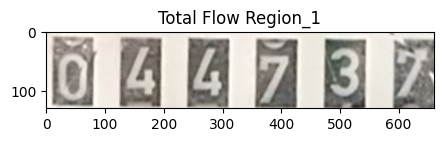

In [248]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_1 = rotated_img[60:190, 80:740]

totalflow_rgb_1 = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb_1)
plt.title('Total Flow Region_1')
plt.show()

#### Process the extracted image to augment the numbers
Included: transform to gray-scale, denoising using Gaussian Blur, sharpening, binary and inverted, zoom the image

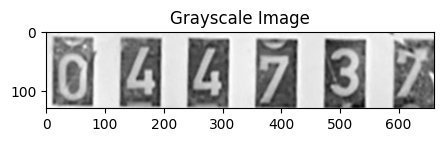

In [249]:
# transform to grey-scale
gray = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(5, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

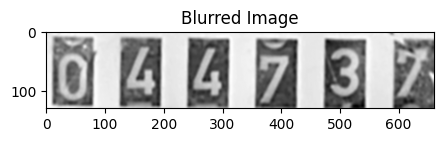

In [250]:
# Denoising using GaussianBlur
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

plt.figure(figsize=(5, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred Image')
plt.show()

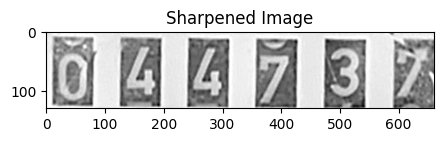

In [251]:
# Sharpening using kernel
import numpy as np

kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
sharpened = cv2.filter2D(blurred, -1, kernel)

plt.figure(figsize=(5, 4))
plt.imshow(sharpened, cmap='gray')
plt.title('Sharpened Image')
plt.show()

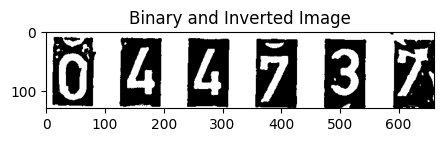

In [252]:
# Binary and inverted the image
_, binary = cv2.threshold(sharpened, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
inverted = cv2.bitwise_not(binary)

plt.figure(figsize=(5, 4))
plt.imshow(binary, cmap='gray')
plt.title('Binary and Inverted Image')
plt.show()

Because all numbers are in black squares, it's hard for tesseract to extract directly, so I need to convert the image into 6 separate squares, recoginze the digit in each square.

In [253]:
# segment the image by contour squares
contours, _ = cv2.findContours(inverted, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

contours = sorted(contours, key=lambda c: cv2.boundingRect(c)[0])

char_images = []

for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)

    if w < 11 or h < 20:
        continue

    roi = binary[y:y+h, x:x+w]

    pad = 5
    roi_padded = cv2.copyMakeBorder(roi, pad, pad, pad, pad, cv2.BORDER_CONSTANT, value=255)

    char_images.append(roi_padded)

print(f"total extracted {len(char_images)} area")

total extracted 6 area


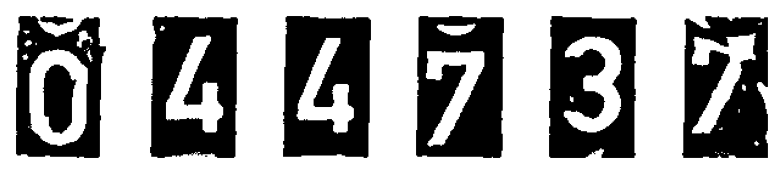

In [254]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 2))
for i in range(len(char_images)):
    plt.subplot(1, len(char_images), i+1)
    plt.imshow(char_images[i], cmap='gray')
    plt.axis('off')
plt.show()


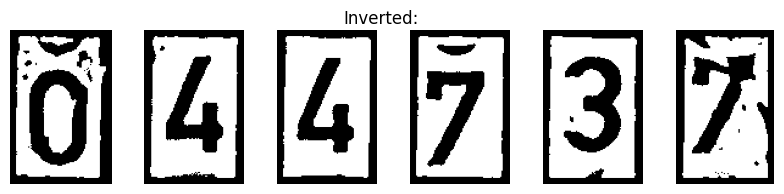

In [255]:
# invert the image to white background, black text, easier for pytesseract to recognize
inverted_char_images = [cv2.bitwise_not(img) for img in char_images]

plt.figure(figsize=(10, 2))
for i in range(len(inverted_char_images)):
    plt.subplot(1, len(inverted_char_images), i + 1)
    plt.imshow(inverted_char_images[i], cmap='gray')
    plt.axis('off')
plt.suptitle('Inverted:')
plt.show()

#### Recognize Numbers

For tesseract, it needs to recognize digit one by one (block by block).

But in the for loop, I set the code to output the digits in one line.

Error handling: if one image cannot be detected, return 'N' for that position.

In [256]:
custom_config = r'--oem 3 --psm 10 -c tessedit_char_whitelist=0123456789'

result_digits_1 = ""

for img in inverted_char_images:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    text = pytesseract.image_to_string(img_rgb, config=custom_config).strip()

    #
    if text.isdigit() and len(text) == 1:
        result_digits_1 += text
    else:
        result_digits_1 += "N"

print(f"numercial digits: {result_digits_1}")


numercial digits: 044737


The result is correct, no need for other methods.

### Step 2: Current total flow_2

*0.1 circle dial


#### Extract and Rotate

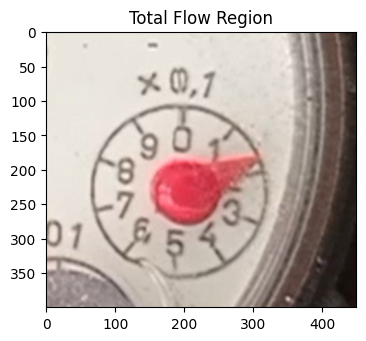

In [257]:
# Roughly extract from original image
totalflow_region_2 = img4[1000:1400, 2300:2750]

totalflow_rgb = cv2.cvtColor(totalflow_region_2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

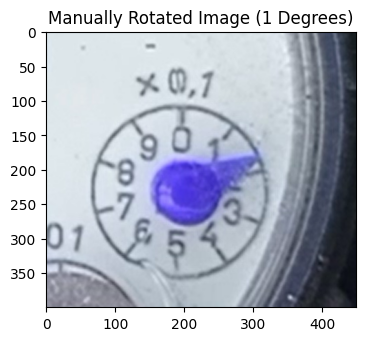

In [258]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_2, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degrees)')
plt.show()

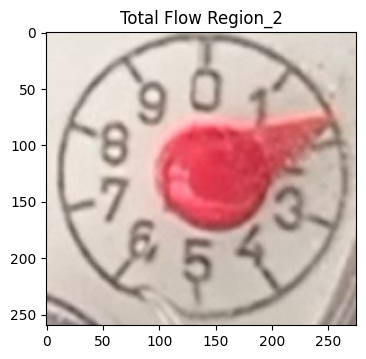

In [259]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_2 = rotated_img[105:365, 55:330]

totalflow_rgb_2 = cv2.cvtColor(totalflow_region_2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_2)
plt.title('Total Flow Region_2')
plt.show()

#### Process the extracted image
The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.



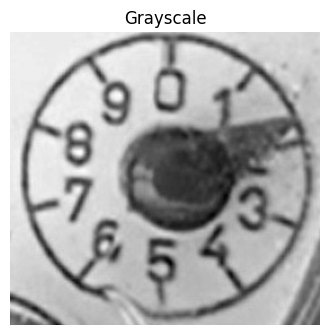

In [260]:
#gray scale
img = totalflow_region_2.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()

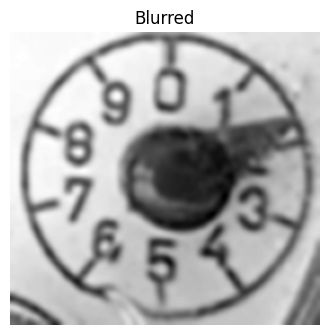

In [261]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

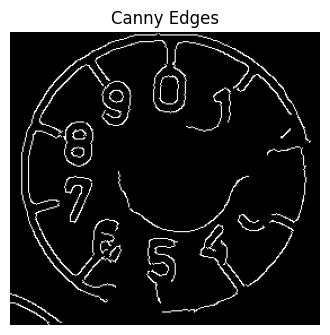

In [262]:
# detect edge
edges = cv2.Canny(blurred, 50, 150)

plt.figure(figsize=(4, 4))
plt.imshow(edges, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')
plt.show()

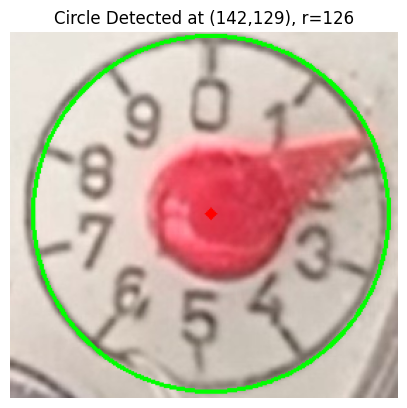

In [263]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[1097.]
 [ 694.]
 [ 781.]
 [ 564.]
 [ 679.]
 [ 780.]
 [ 892.]
 [ 719.]
 [1884.]
 [1895.]]
Mask stats:
[  0 255]


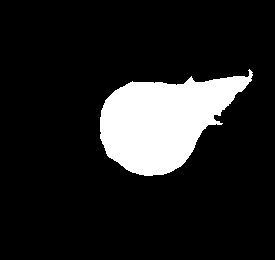

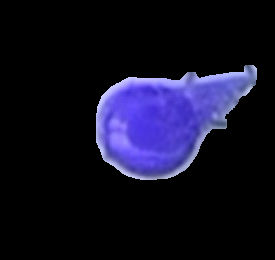

In [264]:
# Detect dial hand: find and enhance red color
hsv = cv2.cvtColor(totalflow_rgb_2, cv2.COLOR_RGB2HSV)

hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])

# find the red area
mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2

print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

# enhance the red area
kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_2, totalflow_rgb_2, mask=mask)

# visualize
cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()



#### Read the number on dial

Find the center of the red area, draw a line from the center of the circle to center of the red area, as the clock hand.

Then calculate the angle between the line and the horizon line. Convert the angle into number on dial.

65.55604521958347
Angle: 65.56°
Number on dial: 1


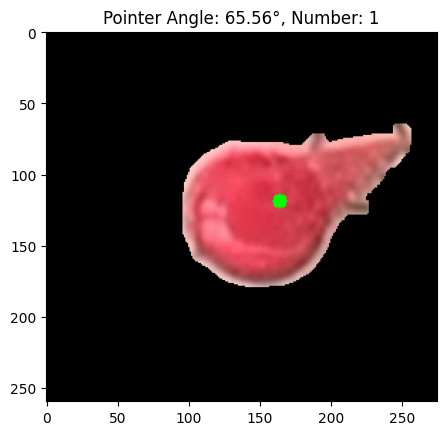

In [265]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

# find the outline of the red area
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
max_contour = max(contours, key=cv2.contourArea)

# find the center of red area
M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0

# show center of red area by green point
cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)

# calculate the angle of clock hand
cx_center, cy_center = 142, 129

# calculate the angle
dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg =90+ math.degrees(angle)

print(angle_deg)


# convert the angle into numbers
# Because there're 9 numbers on the dial, so every interval has 36 degree
num_value_1 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_1}")

# visualize
plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_1}")
plt.show()

### Step 3: Current total flow_3

*0.01 circle dial

#### Extract and Rotate

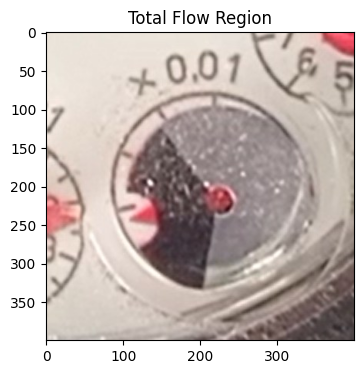

In [266]:
# Roughly extract from original image
totalflow_region_3 = img4[1250:1650, 2100:2500]

totalflow_rgb = cv2.cvtColor(totalflow_region_3, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

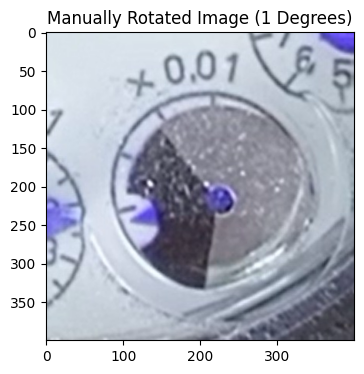

In [267]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_3, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degrees)')
plt.show()

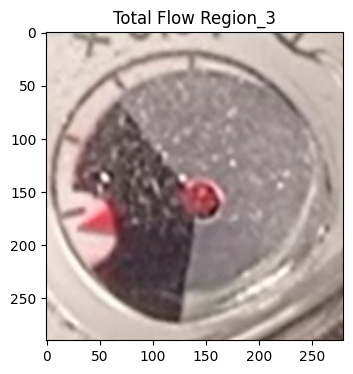

In [268]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_3 = rotated_img[60:350, 80:360]

totalflow_rgb_3 = cv2.cvtColor(totalflow_region_3, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_3)
plt.title('Total Flow Region_3')
plt.show()

#### Process the extracted image
The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.


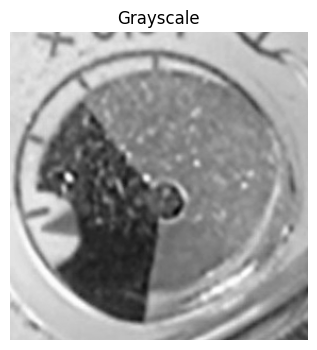

In [269]:
#gray scale
img = totalflow_region_3.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()


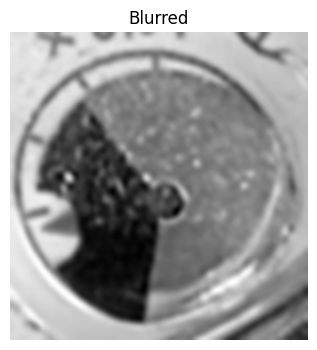

In [270]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

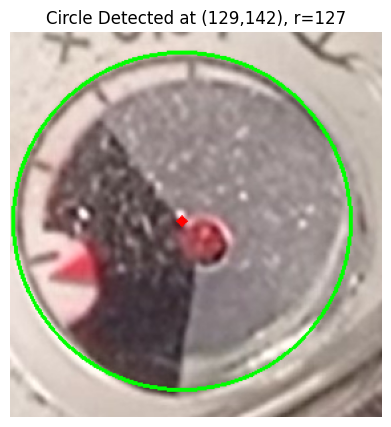

In [271]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[12396.]
 [  876.]
 [ 2966.]
 [ 1716.]
 [  926.]
 [ 4914.]
 [ 1201.]
 [  891.]
 [ 3531.]
 [ 2994.]]
Mask stats:
[  0 255]


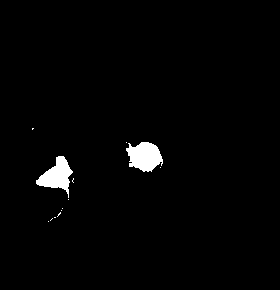

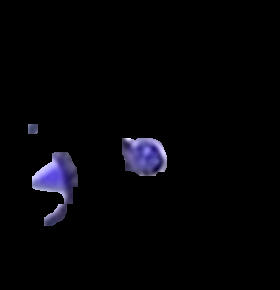

In [272]:
# Detect dial hand: find and enhance red color
hsv = cv2.cvtColor(totalflow_rgb_3, cv2.COLOR_RGB2HSV)


hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])


mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2


print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_3, totalflow_rgb_3, mask=mask)


cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### Read the number on dial

240.94539590092285
Angle: 240.95°
Number on dial: 6


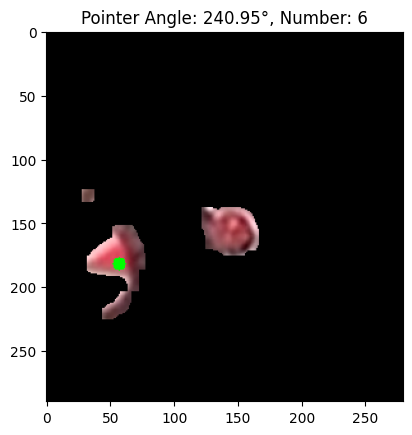

In [273]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
max_contour = max(contours, key=cv2.contourArea)

M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0


cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)


cx_center, cy_center = 129, 142


dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg = 90+ math.degrees(angle)

print(angle_deg)

num_value_2 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_2}")

plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_2}")
plt.show()

### Step 4: Current total flow_4

*0.001 circle dial

#### Extract and Rotate

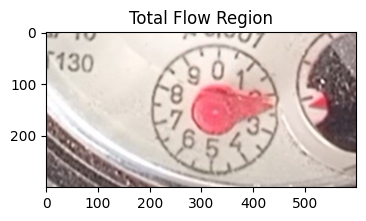

In [274]:
# Roughly extract from original image
totalflow_region_4 = img4[1350:1650, 1700:2300]

totalflow_rgb = cv2.cvtColor(totalflow_region_4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

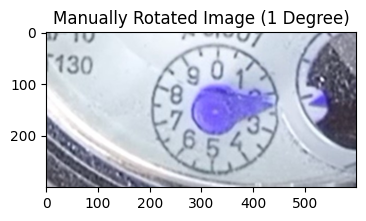

In [275]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_4, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degree)')
plt.show()

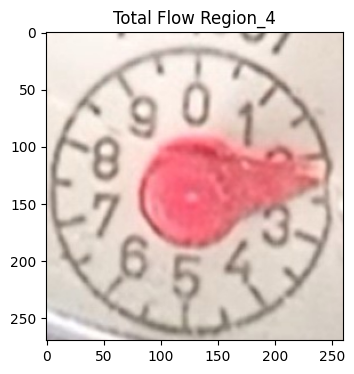

In [276]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_4 = rotated_img[10:280, 200:460]

totalflow_rgb_4 = cv2.cvtColor(totalflow_region_4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_4)
plt.title('Total Flow Region_4')
plt.show()

#### Process the etracted image

The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.

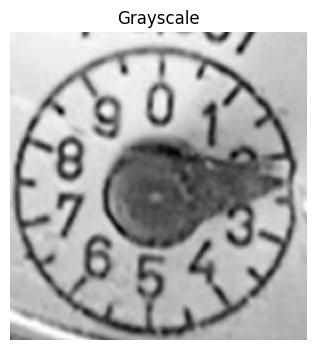

In [277]:
#gray scale
img = totalflow_region_4.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()

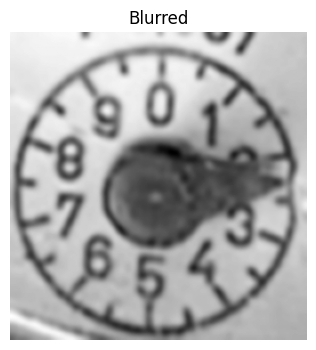

In [278]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

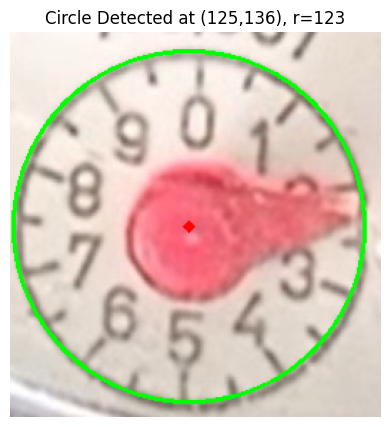

In [279]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[ 893.]
 [ 667.]
 [ 578.]
 [ 511.]
 [ 621.]
 [ 768.]
 [ 913.]
 [ 958.]
 [2119.]
 [2361.]]
Mask stats:
[  0 255]


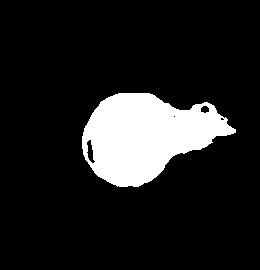

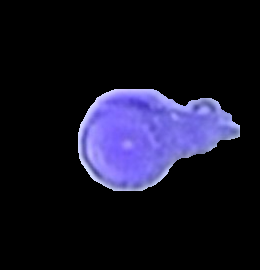

In [280]:
# Detect dial hand: find and enhance red color
from google.colab.patches import cv2_imshow

hsv = cv2.cvtColor(totalflow_rgb_4, cv2.COLOR_RGB2HSV)

hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])

mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2

print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_4, totalflow_rgb_4, mask=mask)

cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### Read the number on dial

87.27368900609373
Angle: 87.27°
Number on dial: 2


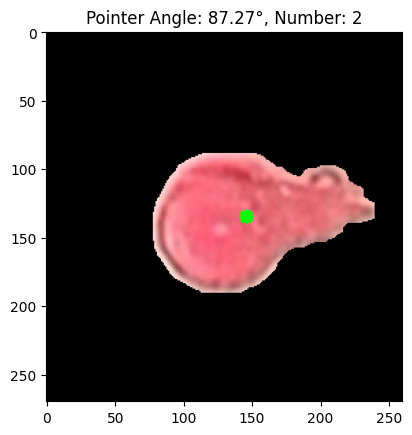

In [281]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

max_contour = max(contours, key=cv2.contourArea)

M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0


cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)


cx_center, cy_center = 125, 136

dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg = 90+ math.degrees(angle)

print(angle_deg)

num_value_3 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_3}")

plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_3}")
plt.show()

### Step 5: Timestamp

#### Extract
Because the timestamp is already horizonal, so no need for rotating.

In [352]:
print(img4.shape)

(2160, 3840, 3)


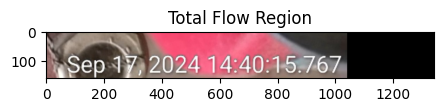

In [353]:
totalflow_region = img4[2000:2160, 2500:3840]

totalflow_rgb = cv2.cvtColor(totalflow_region, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

#### Process the extracted image to augment the text
Because the color in background is too noisy, so need to focus on augmenting the text.

Included: transform to gray-scale, ehnace, sharpening, binary and inverted.

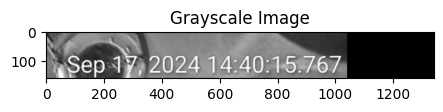

In [354]:
# transform to grey-scale
gray = cv2.cvtColor(totalflow_region, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(5, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

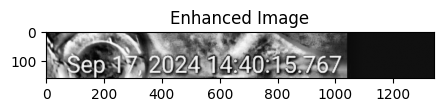

In [355]:
# Enhance the image
clahe = cv2.createCLAHE(clipLimit=15.0, tileGridSize=(8, 8))
enhanced = clahe.apply(gray)

plt.figure(figsize=(5, 4))
plt.imshow(enhanced, cmap='gray')
plt.title('Enhanced Image')
plt.show()

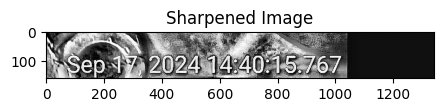

In [356]:
# Sharpening using kernel

kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
sharpened = cv2.filter2D(enhanced, -1, kernel)

plt.figure(figsize=(5, 4))
plt.imshow(sharpened, cmap='gray')
plt.title('Sharpened Image')
plt.show()

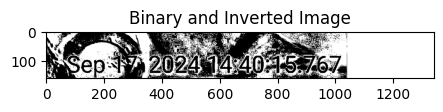

In [357]:
# Binary and inverted the image
_, binary = cv2.threshold(sharpened, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
inverted = cv2.bitwise_not(binary)

plt.figure(figsize=(5, 4))
plt.imshow(inverted, cmap='gray')
plt.title('Binary and Inverted Image')
plt.show()

#### Recognize the text

With prior experience, for sample data (4) timestamp extracting, I'll try the advance method PaddleOCR directly.

And first I tried to use inverted image for recognization. But the result is not good.

In [363]:
# try advance method directly: PaddleOCR + regularization
ocr = PaddleOCR(use_angle_cls=True, lang='en')

if len(inverted.shape) == 2:
    inverted_bgr = cv2.cvtColor(inverted, cv2.COLOR_GRAY2BGR)
else:
    inverted_bgr = inverted

result = ocr.ocr(inverted_bgr, cls=True)

for line in result[0]:
    text = line[1][0]
    confidence = line[1][1]

    formatted_text = re.sub(r'(\b[Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec]{3})\s*(\d{1,2})\.(\d{4})\s*(\d{2}):(\d{2}):(\d{2}\.\d{3})', r'\1 \2.\3 \4:\5:\6', text)

    print(f"text: {formatted_text}, confidence: {confidence:.2f}")

text: 6ep17 2024 14:4015.767, confidence: 0.84


Because the background is noisy, so timestamp reading is not perfect. Eg, it will misread the Month, or ignore the comma.

According to the image processing output, sharpened image is clearer, so I tried to use sharpened image to read again.

In [364]:
# try advance method directly: PaddleOCR + regularization
ocr = PaddleOCR(use_angle_cls=True, lang='en')

if len(sharpened.shape) == 2:
    sharpened_bgr = cv2.cvtColor(sharpened, cv2.COLOR_GRAY2BGR)
else:
    sharpened_bgr = sharpened

result = ocr.ocr(sharpened_bgr, cls=True)

for line in result[0]:
    text = line[1][0]
    confidence = line[1][1]

    formatted_text = re.sub(r'(\b[Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec]{3})\s*(\d{1,2})\.(\d{4})\s*(\d{2}):(\d{2}):(\d{2}\.\d{3})', r'\1 \2.\3 \4:\5:\6', text)

    print(f"text: {formatted_text}, confidence: {confidence:.2f}")

text: Sep17202414:40:15.767, confidence: 0.98


For sharpened image, it can read the month correctly, but cannot read the space and comma.

So I added two more layers to correct the output.

Layer 1: Chek and correct the month

Layer 2: Check if for format is MMM DD, YYYY HH:MM:SS.SSS

In [366]:
# Add format check and correct layer

def correct_month_if_needed(text):
    valid_months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                    'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    first_word = text[:3]
    match = difflib.get_close_matches(first_word, valid_months, n=1, cutoff=0.3)
    if match and first_word != match[0]:
        corrected = match[0] + text[3:]
        return corrected
    return text

def enforce_timestamp_format(text):
    match = re.search(
        r'([A-Za-z]{3})\s*(\d{1,2})[,.]?\s*(\d{4})\s*(\d{2})[:]?(\d{2})[:]?(\d{2}\.\d{3})',
        text
    )
    if not match:
        return "[Invalid Format]"

    month, day, year, hour, minute, second = match.groups()
    return f"{month} {int(day):02d}, {year} {hour}:{minute}:{second}"

# -------- PaddleOCR + Regularization + Month Correction + Format Correction --------
ocr = PaddleOCR(use_angle_cls=True, lang='en')

if len(inverted.shape) == 2:
    inverted_bgr = cv2.cvtColor(inverted, cv2.COLOR_GRAY2BGR)
else:
    inverted_bgr = inverted

result = ocr.ocr(inverted_bgr, cls=True)

for line in result[0]:
    text = line[1][0]
    confidence = line[1][1]

    formatted_text = re.sub(
        r'(\b[Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec]{3})\s*(\d{1,2})\.(\d{4})\s*(\d{2}):(\d{2}):(\d{2}\.\d{3})',
        r'\1 \2.\3 \4:\5:\6', text
    )

    formatted_text = correct_month_if_needed(formatted_text)

    formatted_text = enforce_timestamp_format(formatted_text)

    print(f"text: {formatted_text}, confidence: {confidence:.2f}")


text: Sep 17, 2024 14:40:15.767, confidence: 0.84


### Step 6: Output the data

In [291]:
# Combine the total current flow as a new string
# Current total flow=current total flow_1+ 0.1 *current total flow_2+0.01 *current total flow_3+0.001 *current total flow_4
# Add decimal point after the current total flow_1, and append current total flow_2, current total flow_3, current total flow_4 (convert into str format)
final_result = result_digits_1 + "." + str(num_value_1)+ str(num_value_2)+ str(num_value_3)

print(final_result)

044737.162


#### Output in csv file

In [292]:
output_path = '/content/drive/MyDrive/data_extracting_assessment_outputs/output_sample_4.csv'

df = pd.DataFrame({
    'current_total_flow': [final_result],
    'timestamp': [formatted_text]
})

os.makedirs(os.path.dirname(output_path), exist_ok=True)
df.to_csv(output_path, mode='w', index=False, header=not os.path.exists(output_path))


#### Output in annoted image

I copied the original image and annoted the current total flow and timestamp next to the text on image.

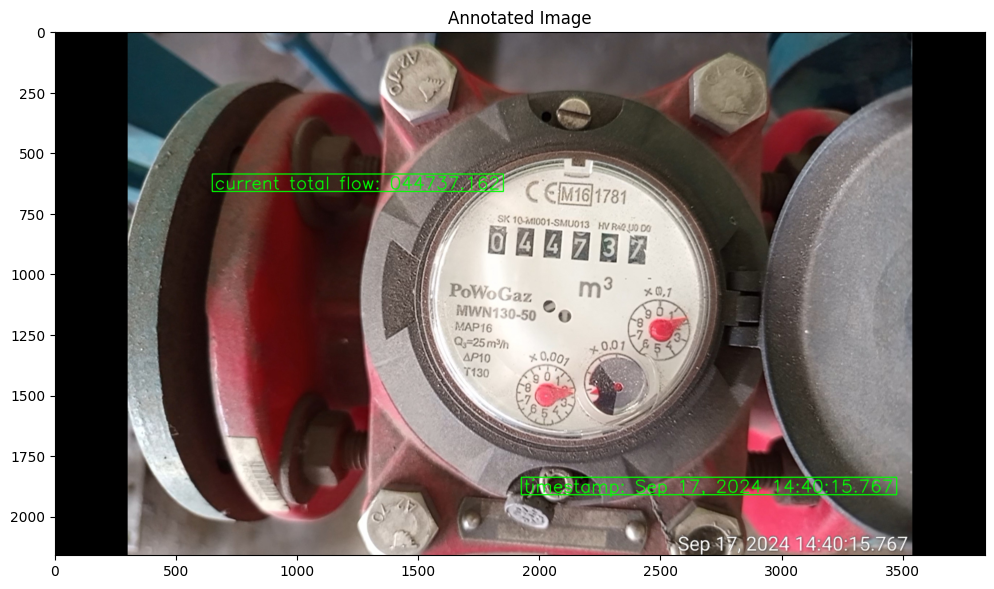

In [293]:
# read original image and make a copy
img1 = cv2.imread('/content/drive/MyDrive/sample_data/sample_data (4).jpg')
copy_img1 = img1.copy()

# prepare annotation texts
flow_text = f"current total flow: {final_result}"
timestamp_text = f"timestamp: {formatted_text}"

# set font style and color: green
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 2.4
font_thickness = 4
font_color = (0, 255, 0)
rectangle_color = (0, 255, 0)

# helper function to draw text with bounding box
def draw_text_with_box(img, text, x_range, y_range):
    x_center = (x_range[0] + x_range[1]) // 2
    y_center = (y_range[0] + y_range[1]) // 2

    # calculate text size
    (text_width, text_height), baseline = cv2.getTextSize(text, font, font_scale, font_thickness)

    # compute top-left corner of text to center it inside the region
    top_left_x = x_center - text_width // 2
    top_left_y = y_center - text_height // 2

    # draw rectangle box slightly larger than text
    cv2.rectangle(img,
                  (top_left_x - 10, top_left_y - 10),
                  (top_left_x + text_width + 10, top_left_y + text_height + 10),
                  rectangle_color, 4)

    # put text inside the rectangle
    cv2.putText(img, text,
                (top_left_x, top_left_y + text_height),
                font, font_scale, font_color, font_thickness)

# ----- annotate current_total_flow -----
# region: x 1000-1500,  y 500-750
draw_text_with_box(copy_img1, flow_text, x_range=(1000, 1500), y_range=(500, 750))

# ----- annotate timestamp -----
# region: x 2200-3200, y 1750-2000
draw_text_with_box(copy_img1, timestamp_text, x_range=(2200, 3200), y_range=(1750, 2000))

# ----- save and visualize output -----
output_path = '/content/drive/MyDrive/data_extracting_assessment_outputs/output_sample_4.jpg'
cv2.imwrite(output_path, copy_img1)

# visualize in notebook
img_rgb = cv2.cvtColor(copy_img1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 10))
plt.imshow(img_rgb)
plt.title("Annotated Image")
plt.axis('on')
plt.show()



## sample_data (6)

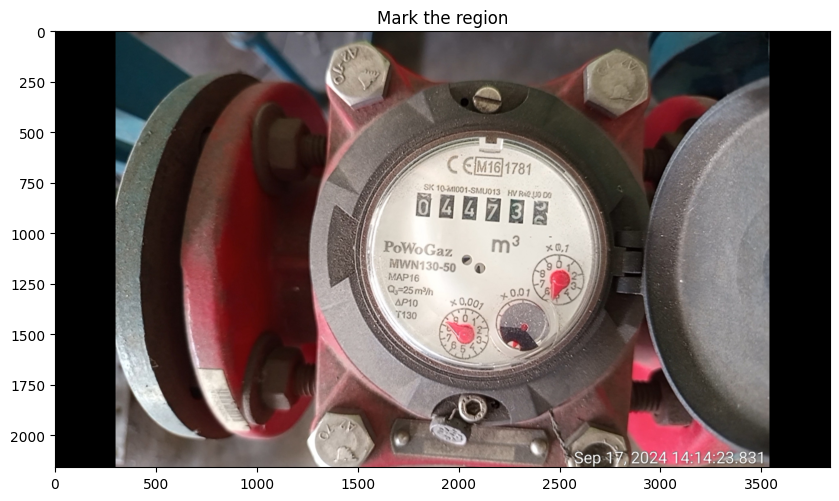

In [302]:
# Show image with oordinate axis
img6 = cv2.imread('/content/drive/MyDrive/sample_data/sample_data (6).jpg')
img_rgb = cv2.cvtColor(img6, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,8))
plt.imshow(img_rgb)
plt.title('Mark the region')
plt.show()

### Step 1: Current Total Flow_1

#### Extract and Rotate
Because it's hard for tesseract to recognize image which is skewed, so need to rotate the image to horizonal line.

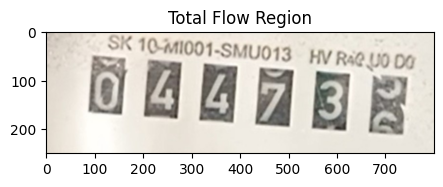

In [303]:
# Roughly extract from original image
totalflow_region_1 = img6[750:1000, 1700:2500]

totalflow_rgb = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

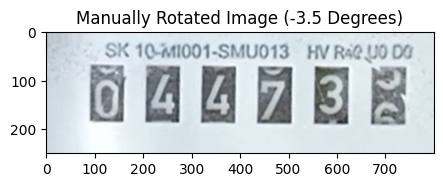

In [304]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_1, 3.5)

plt.figure(figsize=(5, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (-3.5 Degrees)')
plt.show()

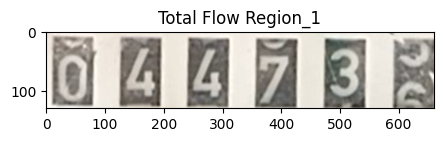

In [305]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_1 = rotated_img[60:190, 80:740]

totalflow_rgb_1 = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb_1)
plt.title('Total Flow Region_1')
plt.show()

#### Process the extracted image to augment the numbers
Included: transform to gray-scale, denoising using Gaussian Blur, sharpening, binary and inverted, zoom the image

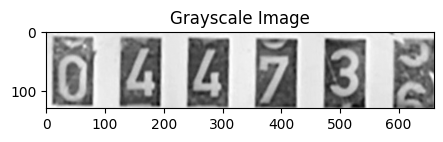

In [306]:
# transform to grey-scale
gray = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(5, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

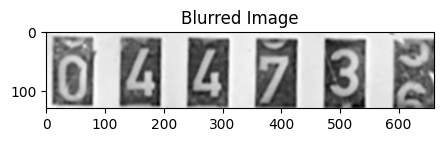

In [307]:
# Denoising using GaussianBlur
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

plt.figure(figsize=(5, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred Image')
plt.show()

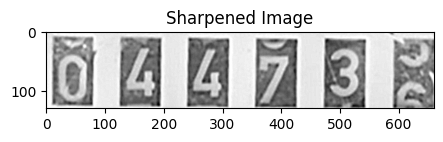

In [308]:
# Sharpening using kernel
kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
sharpened = cv2.filter2D(blurred, -1, kernel)

plt.figure(figsize=(5, 4))
plt.imshow(sharpened, cmap='gray')
plt.title('Sharpened Image')
plt.show()

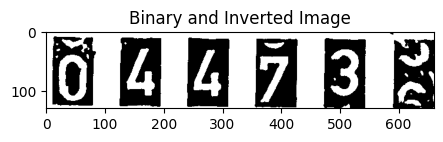

In [309]:
# Binary and inverted the image
_, binary = cv2.threshold(sharpened, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
inverted = cv2.bitwise_not(binary)

plt.figure(figsize=(5, 4))
plt.imshow(binary, cmap='gray')
plt.title('Binary and Inverted Image')
plt.show()

Because all numbers are in black squares, it's hard for tesseract to extract directly, so I need to convert the image into 6 separate squares, recoginze the digit in each square.

In [310]:
# segment the image by contour squares

contours, _ = cv2.findContours(inverted, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

contours = sorted(contours, key=lambda c: cv2.boundingRect(c)[0])

char_images = []

for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)

    if w < 11 or h < 20:
        continue

    roi = binary[y:y+h, x:x+w]

    pad = 5
    roi_padded = cv2.copyMakeBorder(roi, pad, pad, pad, pad, cv2.BORDER_CONSTANT, value=255)

    char_images.append(roi_padded)

print(f"total extracted {len(char_images)} area")


total extracted 6 area


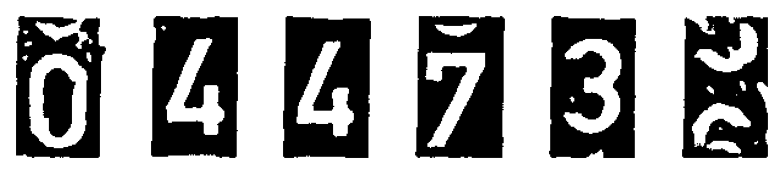

In [311]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 2))
for i in range(len(char_images)):
    plt.subplot(1, len(char_images), i+1)
    plt.imshow(char_images[i], cmap='gray')
    plt.axis('off')
plt.show()


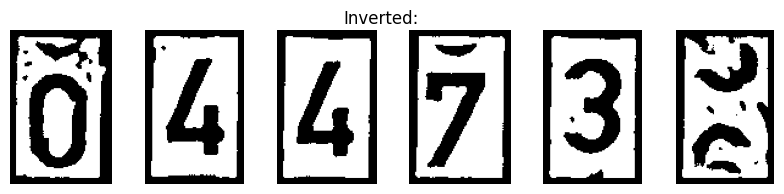

In [312]:
# convert into white background, black text, easier for pytesseract to recognize
inverted_char_images = [cv2.bitwise_not(img) for img in char_images]

plt.figure(figsize=(10, 2))
for i in range(len(inverted_char_images)):
    plt.subplot(1, len(inverted_char_images), i + 1)
    plt.imshow(inverted_char_images[i], cmap='gray')
    plt.axis('off')
plt.suptitle('Inverted:')
plt.show()


#### Recognize Numbers
For tesseract, it needs to recognize digit one by one (block by block).

But in the for loop, I set the code to output the digit in one line.

Error handling: if one image cannot be detected, return 'N' for that position.

In [313]:
custom_config = r'--oem 3 --psm 10 -c tessedit_char_whitelist=0123456789'

result_digits_1 = ""

for img in inverted_char_images:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    text = pytesseract.image_to_string(img_rgb, config=custom_config).strip()

    #
    if text.isdigit() and len(text) == 1:
        result_digits_1 += text
    else:
        result_digits_1 += "N"

print(f"numercial digits: {result_digits_1}")


numercial digits: 04473N


Error handling: For sample_data (6), last digit is unable to read, so it returns N for that digit.

Then I tried to use opencv template match to recognize the undetected ones.

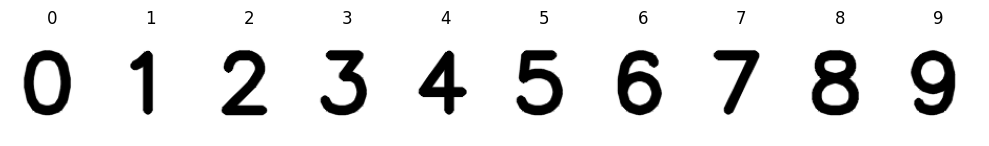

In [314]:
output_dir = "templates"
os.makedirs(output_dir, exist_ok=True)

font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 2.5
thickness = 7

for digit in range(10):
    img = np.ones((100, 80), dtype=np.uint8) * 255
    cv2.putText(img, str(digit), (10, 75), font, font_scale, (0,), thickness, lineType=cv2.LINE_AA)

    cv2.imwrite(os.path.join(output_dir, f"{digit}.png"), img)


plt.figure(figsize=(10, 2))
for i in range(10):
    img_path = os.path.join(output_dir, f"{i}.png")
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    plt.subplot(1, 10, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(str(i))
    plt.axis('off')
plt.tight_layout()
plt.show()


In [315]:
template_dir = "templates"
templates = {}
for fname in os.listdir(template_dir):
    digit = os.path.splitext(fname)[0]
    template_img = cv2.imread(os.path.join(template_dir, fname), cv2.IMREAD_GRAYSCALE)
    templates[digit] = template_img

custom_config = r'--oem 3 --psm 10 -c tessedit_char_whitelist=0123456789'

result_digits_2 = ""

for idx, img in enumerate(inverted_char_images):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    text = pytesseract.image_to_string(img_rgb, config=custom_config).strip()

    if text.isdigit() and len(text) == 1:
        result_digits_2 += text
    else:
        best_score = 0
        best_match = "N"
        for digit, tmpl in templates.items():
            resized_img = cv2.resize(img, tmpl.shape[::-1])
            res = cv2.matchTemplate(resized_img, tmpl, cv2.TM_CCOEFF_NORMED)
            _, score, _, _ = cv2.minMaxLoc(res)
            if score > best_score:
                best_score = score
                best_match = digit

        if best_score > 0.1:
            result_digits_2 += best_match
        else:
            result_digits_2 += "N"

print(f"result_digits_2: {result_digits_2}")


result_digits_2: 04473N


Although I set the threshold to 0.1, it still cannot match any number to that digit.

So I'll keep the original one 'result_digits_1'.

### Step 2: Current total flow_2

*0.1 circle dial


#### Extract and Rotate

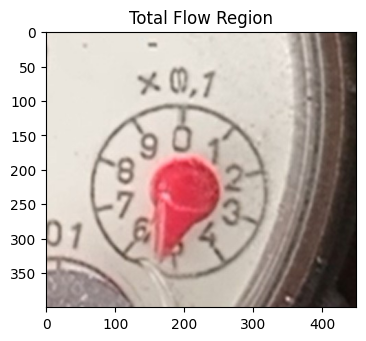

In [316]:
# Roughly extract from original image
totalflow_region_2 = img6[1000:1400, 2300:2750]

totalflow_rgb = cv2.cvtColor(totalflow_region_2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

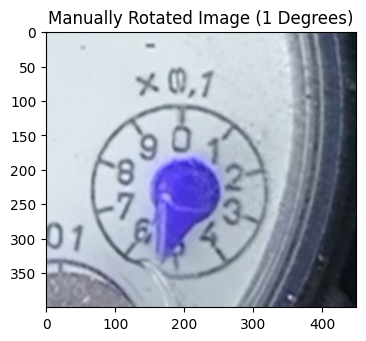

In [317]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_2, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degrees)')
plt.show()

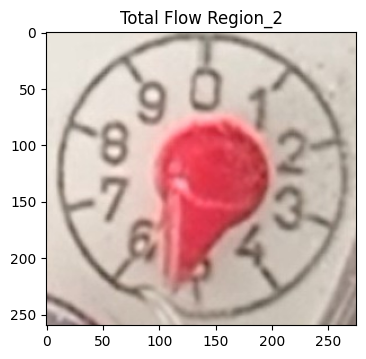

In [318]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_2 = rotated_img[105:365, 55:330]

totalflow_rgb_2 = cv2.cvtColor(totalflow_region_2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_2)
plt.title('Total Flow Region_2')
plt.show()

#### Process the extracted image
The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.



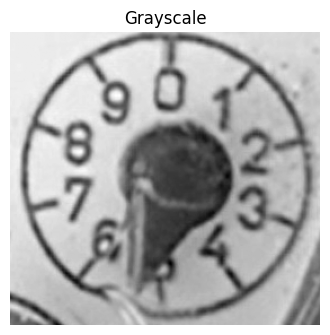

In [319]:
#gray scale
img = totalflow_region_2.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()

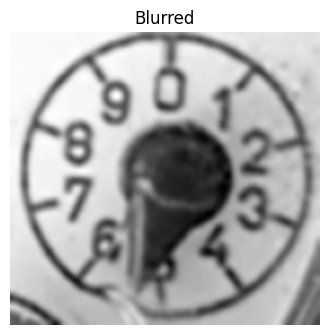

In [320]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

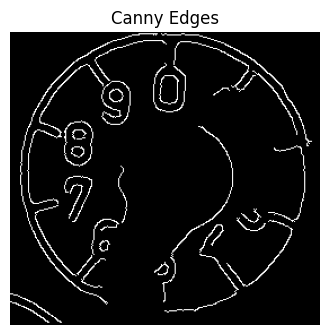

In [321]:
# detect edge
edges = cv2.Canny(blurred, 50, 150)

plt.figure(figsize=(4, 4))
plt.imshow(edges, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')
plt.show()

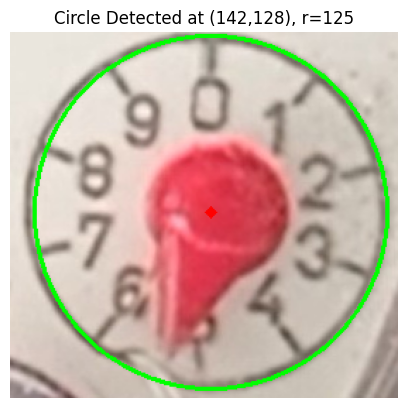

In [322]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[ 958.]
 [ 690.]
 [ 742.]
 [ 735.]
 [ 783.]
 [ 810.]
 [1044.]
 [1030.]
 [1531.]
 [1323.]]
Mask stats:
[  0 255]


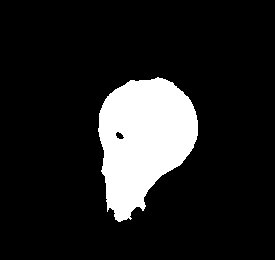

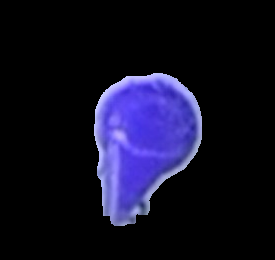

In [323]:
# Detect dial hand: find and enhance red color
hsv = cv2.cvtColor(totalflow_rgb_2, cv2.COLOR_RGB2HSV)

hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])

# find the red area
mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2

print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

# enhance the red area
kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_2, totalflow_rgb_2, mask=mask)

# visualize
cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()



#### Read the number on dial

Find the center of the red area, draw a line from the center of the circle to center of the red area, as the clock hand.

Then calculate the angle between the line and the horizon line. Convert the angle into number on dial.

180.0
Angle: 180.00°
Number on dial: 5


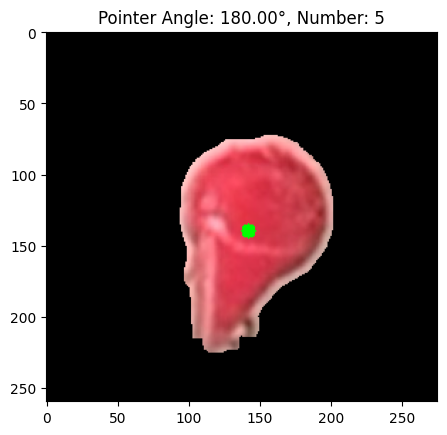

In [324]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

# find the outline of the red area
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
max_contour = max(contours, key=cv2.contourArea)

# find the center of red area
M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0

# show center of red area by green point
cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)

# calculate the angle of clock hand
cx_center, cy_center = 142, 128

# calculate the angle
dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg =90+ math.degrees(angle)

print(angle_deg)


# convert the angle into numbers
# Because there're 9 numbers on the dial, so every interval has 36 degree
num_value_1 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_1}")

# visualize
plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_1}")
plt.show()

### Step 3: Current total flow_3

*0.01 circle dial

#### Extract and Rotate

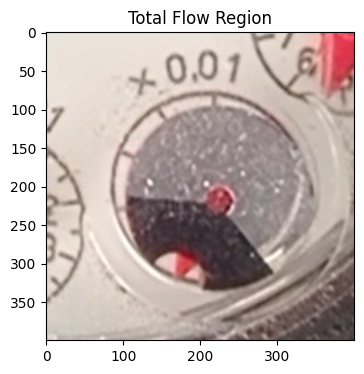

In [325]:
# Roughly extract from original image
totalflow_region_3 = img6[1250:1650, 2100:2500]

totalflow_rgb = cv2.cvtColor(totalflow_region_3, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

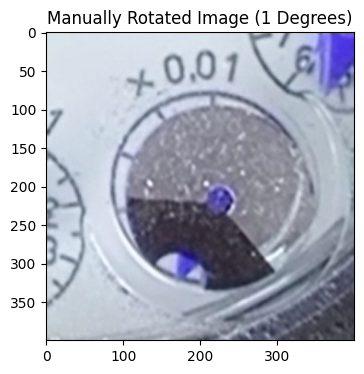

In [326]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_3, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degrees)')
plt.show()

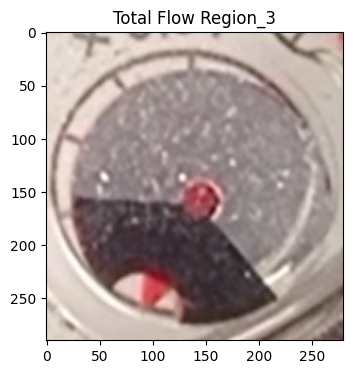

In [327]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_3 = rotated_img[60:350, 80:360]

totalflow_rgb_3 = cv2.cvtColor(totalflow_region_3, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_3)
plt.title('Total Flow Region_3')
plt.show()

#### Process the extracted image
The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.


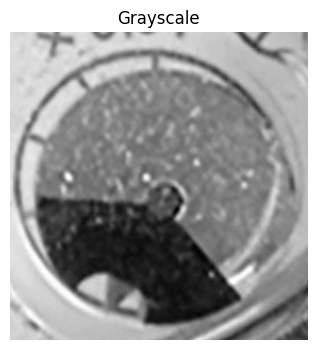

In [328]:
#gray scale
img = totalflow_region_3.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()


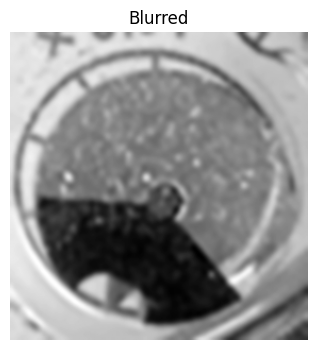

In [329]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

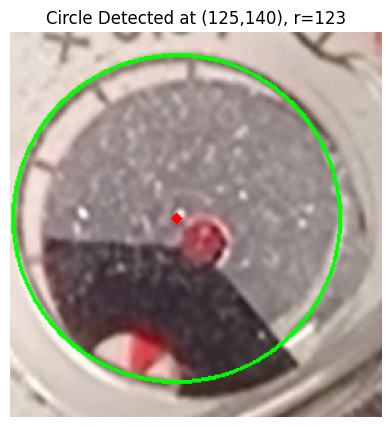

In [330]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[10278.]
 [  862.]
 [ 2627.]
 [ 3617.]
 [ 1283.]
 [ 4413.]
 [ 2220.]
 [ 1143.]
 [ 4727.]
 [ 2774.]]
Mask stats:
[  0 255]


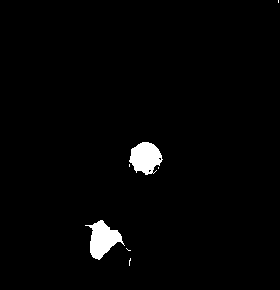

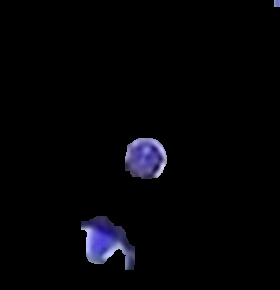

In [331]:
# Detect dial hand: find and enhance red color
hsv = cv2.cvtColor(totalflow_rgb_3, cv2.COLOR_RGB2HSV)


hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])


mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2


print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_3, totalflow_rgb_3, mask=mask)


cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### Read the number on dial

190.65390259993848
Angle: 190.65°
Number on dial: 5


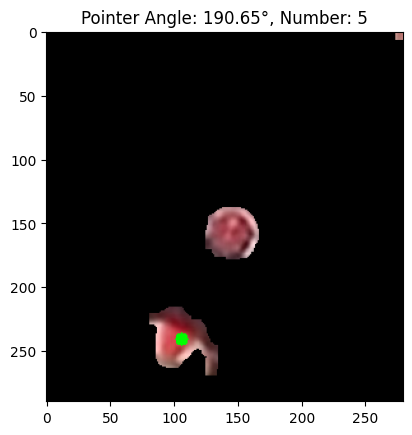

In [332]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
max_contour = max(contours, key=cv2.contourArea)

M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0


cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)


cx_center, cy_center = 125, 140


dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg = 90+ math.degrees(angle)

print(angle_deg)

num_value_2 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_2}")

plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_2}")
plt.show()

### Step 4: Current total flow_4

*0.001 circle dial

#### Extract and Rotate

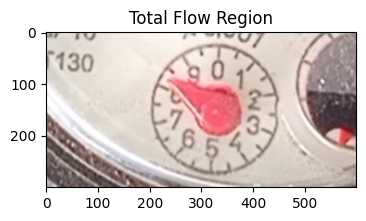

In [333]:
# Roughly extract from original image
totalflow_region_4 = img6[1350:1650, 1700:2300]

totalflow_rgb = cv2.cvtColor(totalflow_region_4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

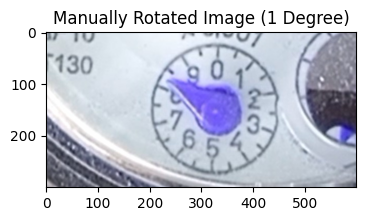

In [334]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_4, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degree)')
plt.show()

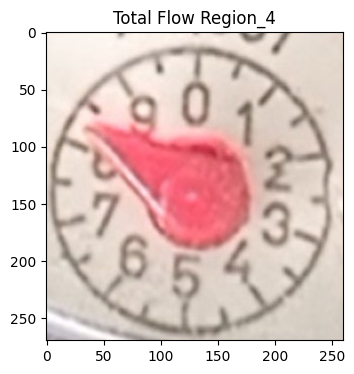

In [335]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_4 = rotated_img[10:280, 200:460]

totalflow_rgb_4 = cv2.cvtColor(totalflow_region_4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_4)
plt.title('Total Flow Region_4')
plt.show()

#### Process the etracted image

The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.

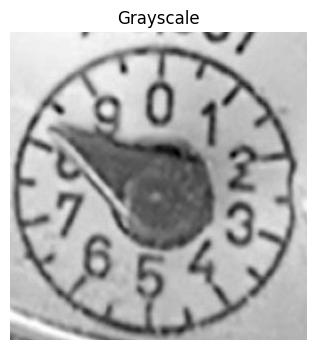

In [336]:
#gray scale
img = totalflow_region_4.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()

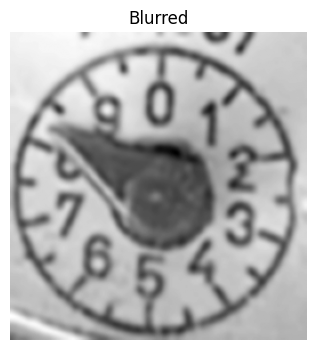

In [337]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

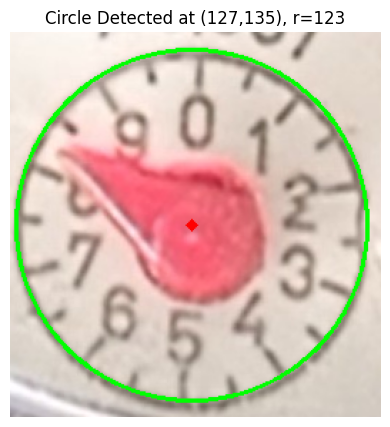

In [338]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[ 916.]
 [ 656.]
 [ 633.]
 [ 617.]
 [ 740.]
 [ 742.]
 [1272.]
 [1088.]
 [1520.]
 [1854.]]
Mask stats:
[  0 255]


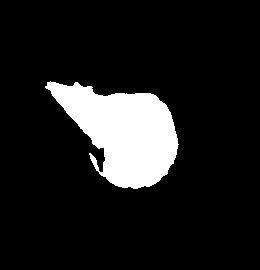

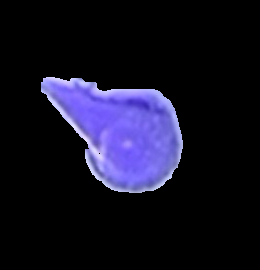

In [339]:
# Detect dial hand: find and enhance red color
from google.colab.patches import cv2_imshow

hsv = cv2.cvtColor(totalflow_rgb_4, cv2.COLOR_RGB2HSV)

hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])

mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2

print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_4, totalflow_rgb_4, mask=mask)

cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### Read the number on dial

299.74488129694225
Angle: 299.74°
Number on dial: 8


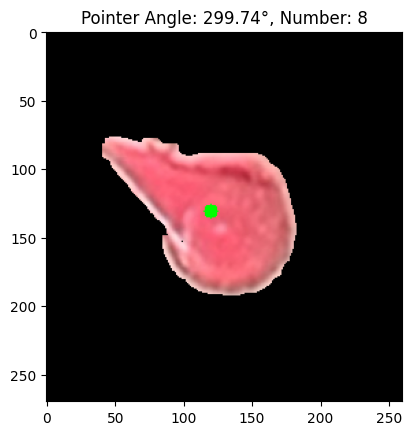

In [340]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

max_contour = max(contours, key=cv2.contourArea)

M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0


cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)


cx_center, cy_center = 127, 135

dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg = 450+ math.degrees(angle)

print(angle_deg)

num_value_3 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_3}")

plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_3}")
plt.show()

### Step 5: Timestamp

#### Extract
Because the timestamp is already horizonal, so no need for rotating.

In [341]:
print(img6.shape)

(2160, 3840, 3)


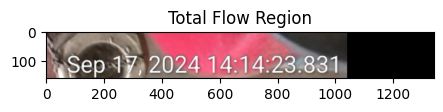

In [342]:
totalflow_region = img6[2000:2160, 2500:3840]

totalflow_rgb = cv2.cvtColor(totalflow_region, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

#### Process the extracted image to augment the text
Because the color in background is too noisy, so need to focus on augmenting the text.

Included: transform to gray-scale, ehnace, sharpening, binary and inverted.

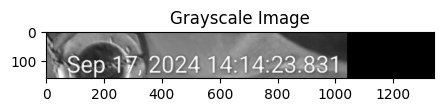

In [343]:
# transform to grey-scale
gray = cv2.cvtColor(totalflow_region, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(5, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

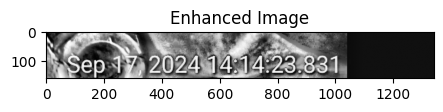

In [344]:
# Enhance the image
clahe = cv2.createCLAHE(clipLimit=15.0, tileGridSize=(8, 8))
enhanced = clahe.apply(gray)

plt.figure(figsize=(5, 4))
plt.imshow(enhanced, cmap='gray')
plt.title('Enhanced Image')
plt.show()

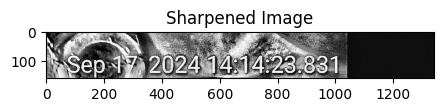

In [345]:
# Sharpening using kernel

kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
sharpened = cv2.filter2D(enhanced, -1, kernel)

plt.figure(figsize=(5, 4))
plt.imshow(sharpened, cmap='gray')
plt.title('Sharpened Image')
plt.show()

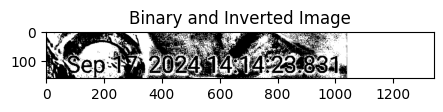

In [346]:
# Binary and inverted the image
_, binary = cv2.threshold(sharpened, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
inverted = cv2.bitwise_not(binary)

plt.figure(figsize=(5, 4))
plt.imshow(inverted, cmap='gray')
plt.title('Binary and Inverted Image')
plt.show()

#### Recognize the text

With prior experience, for sample data (4) timestamp extracting, I'll try the advance method PaddleOCR directly.

First I tried the inverted image, but it's not clear enough, so cannot read the month correctly, and also ignored the commas.

In [347]:
# try advance method directly: PaddleOCR + regularization
#Option 1: use inverted image
ocr = PaddleOCR(use_angle_cls=True, lang='en')

if len(inverted.shape) == 2:
    inverted_bgr = cv2.cvtColor(inverted, cv2.COLOR_GRAY2BGR)
else:
    inverted_bgr = inverted

result = ocr.ocr(inverted_bgr, cls=True)

for line in result[0]:
    text = line[1][0]
    confidence = line[1][1]

    formatted_text = re.sub(r'(\b[Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec]{3})\s*(\d{1,2})\.(\d{4})\s*(\d{2}):(\d{2}):(\d{2}\.\d{3})', r'\1 \2.\3 \4:\5:\6', text)

    print(f"text: {formatted_text}, confidence: {confidence:.2f}")

text: ep17 202414:14:23.831, confidence: 0.93


According to the output of image processing, the sharpened image is clearer. So I tried to use sharpened image to read again. The result is better.

In [348]:
# try advance method directly: PaddleOCR + regularization
#Option 2: use sharpened image
ocr = PaddleOCR(use_angle_cls=True, lang='en')

if len(sharpened.shape) == 2:
    sharpened_bgr = cv2.cvtColor(sharpened, cv2.COLOR_GRAY2BGR)
else:
    sharpened_bgr = sharpened

result = ocr.ocr(sharpened_bgr, cls=True)

for line in result[0]:
    text = line[1][0]
    confidence = line[1][1]

    formatted_text = re.sub(r'(\b[Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec]{3})\s*(\d{1,2})\.(\d{4})\s*(\d{2}):(\d{2}):(\d{2}\.\d{3})', r'\1 \2.\3 \4:\5:\6', text)

    print(f"text: {formatted_text}, confidence: {confidence:.2f}")

text: Sep 17.2024 14:14:23.831, confidence: 0.95


### Step 6: Output the data

In [349]:
# Combine the total current flow as a new string
# Current total flow=current total flow_1+ 0.1 *current total flow_2+0.01 *current total flow_3+0.001 *current total flow_4
# Add decimal point after the current total flow_1, and append current total flow_2, current total flow_3, current total flow_4 (convert into str format)
final_result = result_digits_1 + "." + str(num_value_1)+ str(num_value_2)+ str(num_value_3)

print(final_result)

04473N.558


#### Output in csv file

In [350]:
output_path = '/content/drive/MyDrive/data_extracting_assessment_outputs/output_sample_6.csv'

df = pd.DataFrame({
    'current_total_flow': [final_result],
    'timestamp': [formatted_text]
})

os.makedirs(os.path.dirname(output_path), exist_ok=True)
df.to_csv(output_path, mode='w', index=False, header=not os.path.exists(output_path))


#### Output in annoted image

I copied the original image and annoted the current total flow and timestamp next to the text on image.

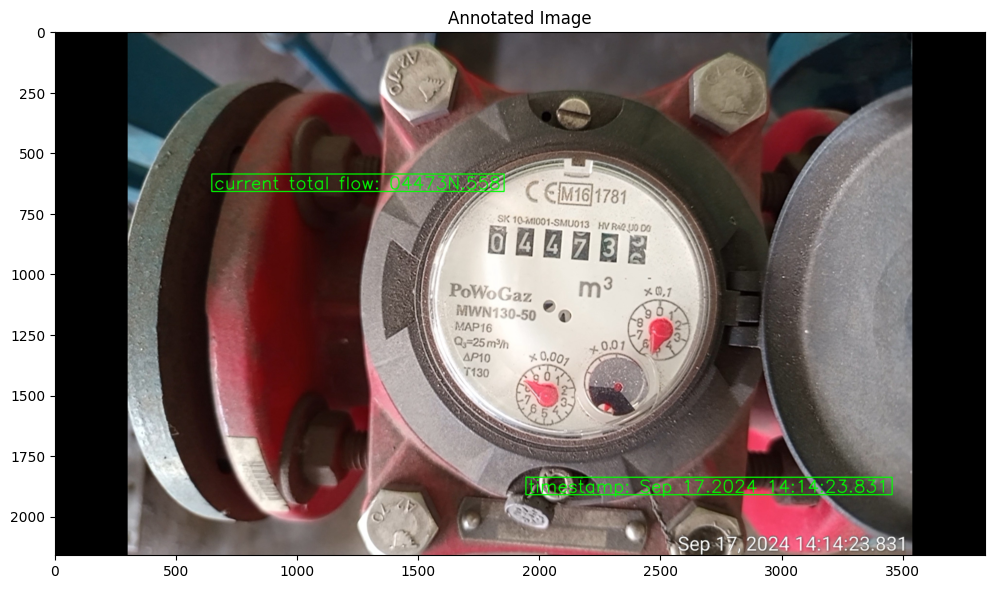

In [351]:
# read original image and make a copy
img6 = cv2.imread('/content/drive/MyDrive/sample_data/sample_data (6).jpg')
copy_img6 = img6.copy()

# prepare annotation texts
flow_text = f"current total flow: {final_result}"
timestamp_text = f"timestamp: {formatted_text}"

# set font style and color: green
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 2.4
font_thickness = 4
font_color = (0, 255, 0)
rectangle_color = (0, 255, 0)

# helper function to draw text with bounding box
def draw_text_with_box(img, text, x_range, y_range):
    x_center = (x_range[0] + x_range[1]) // 2
    y_center = (y_range[0] + y_range[1]) // 2

    # calculate text size
    (text_width, text_height), baseline = cv2.getTextSize(text, font, font_scale, font_thickness)

    # compute top-left corner of text to center it inside the region
    top_left_x = x_center - text_width // 2
    top_left_y = y_center - text_height // 2

    # draw rectangle box slightly larger than text
    cv2.rectangle(img,
                  (top_left_x - 10, top_left_y - 10),
                  (top_left_x + text_width + 10, top_left_y + text_height + 10),
                  rectangle_color, 4)

    # put text inside the rectangle
    cv2.putText(img, text,
                (top_left_x, top_left_y + text_height),
                font, font_scale, font_color, font_thickness)

# ----- annotate current_total_flow -----
# region: x 1000-1500,  y 500-750
draw_text_with_box(copy_img6, flow_text, x_range=(1000, 1500), y_range=(500, 750))

# ----- annotate timestamp -----
# region: x 2200-3200, y 1750-2000
draw_text_with_box(copy_img6, timestamp_text, x_range=(2200, 3200), y_range=(1750, 2000))

# ----- save and visualize output -----
output_path = '/content/drive/MyDrive/data_extracting_assessment_outputs/output_sample_6.jpg'
cv2.imwrite(output_path, copy_img6)

# visualize in notebook
img_rgb = cv2.cvtColor(copy_img6, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 10))
plt.imshow(img_rgb)
plt.title("Annotated Image")
plt.axis('on')
plt.show()



## sample_data (15)

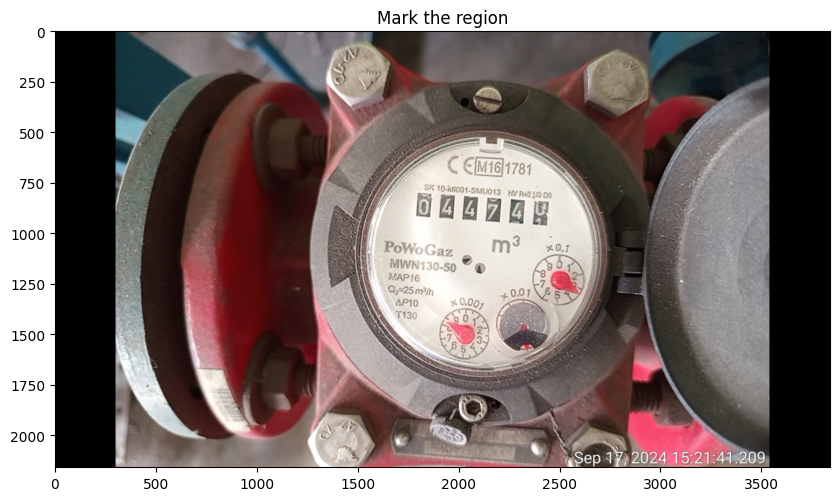

In [186]:
# Show image with oordinate axis
img15 = cv2.imread('/content/drive/MyDrive/sample_data/sample_data (15).jpg')
img_rgb = cv2.cvtColor(img15, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,8))
plt.imshow(img_rgb)
plt.title('Mark the region')
plt.show()

### Step 1: Current Total Flow_1

#### Extract and Rotate
Because it's hard for tesseract to recognize image which is skewed, so need to rotate the image to horizonal line.

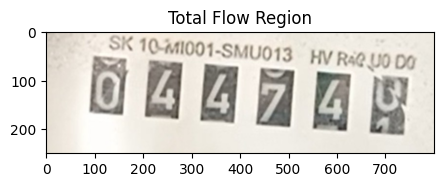

In [187]:
# Roughly extract from original image
totalflow_region_1 = img15[750:1000, 1700:2500]

totalflow_rgb = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

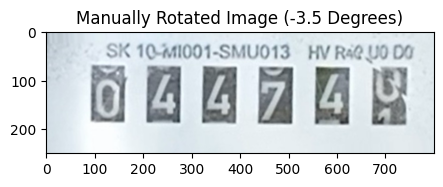

In [188]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_1, 3.5)

plt.figure(figsize=(5, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (-3.5 Degrees)')
plt.show()

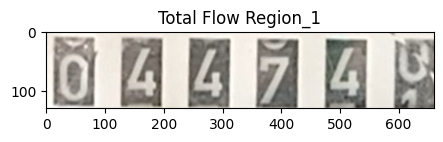

In [189]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_1 = rotated_img[60:190, 80:740]

totalflow_rgb_1 = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb_1)
plt.title('Total Flow Region_1')
plt.show()

#### Process the extracted image to augment the numbers
Included: transform to gray-scale, denoising using Gaussian Blur, sharpening, binary and inverted, zoom the image

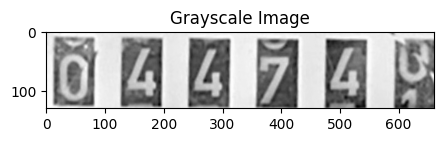

In [190]:
# transform to grey-scale
gray = cv2.cvtColor(totalflow_region_1, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(5, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

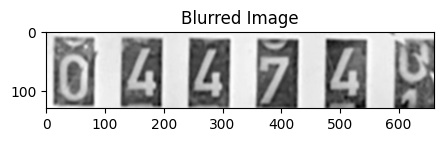

In [191]:
# Denoising using GaussianBlur
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

plt.figure(figsize=(5, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred Image')
plt.show()

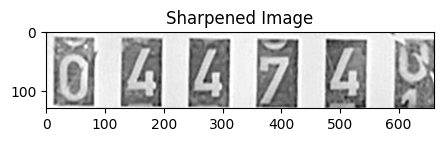

In [192]:
# Sharpening using kernel
import numpy as np

kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
sharpened = cv2.filter2D(blurred, -1, kernel)

plt.figure(figsize=(5, 4))
plt.imshow(sharpened, cmap='gray')
plt.title('Sharpened Image')
plt.show()

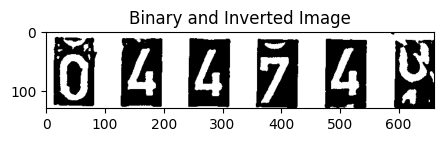

In [193]:
# Binary and inverted the image
_, binary = cv2.threshold(sharpened, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
inverted = cv2.bitwise_not(binary)

plt.figure(figsize=(5, 4))
plt.imshow(binary, cmap='gray')
plt.title('Binary and Inverted Image')
plt.show()

Because all numbers are in black squares, it's hard for tesseract to extract directly, so I need to convert the image into 6 separate squares, recoginze the digit in each square.

In [194]:
import cv2

contours, _ = cv2.findContours(inverted, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

contours = sorted(contours, key=lambda c: cv2.boundingRect(c)[0])

char_images = []

for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)

    if w < 11 or h < 20:
        continue

    roi = binary[y:y+h, x:x+w]

    pad = 5
    roi_padded = cv2.copyMakeBorder(roi, pad, pad, pad, pad, cv2.BORDER_CONSTANT, value=255)

    char_images.append(roi_padded)

print(f"total extracted {len(char_images)} area")

total extracted 6 area


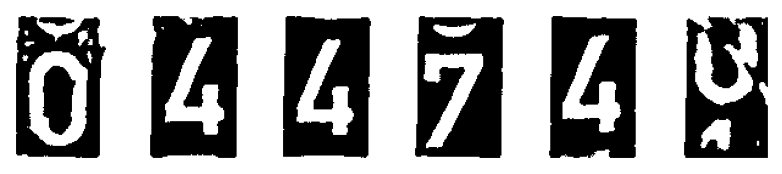

In [195]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 2))
for i in range(len(char_images)):
    plt.subplot(1, len(char_images), i+1)
    plt.imshow(char_images[i], cmap='gray')
    plt.axis('off')
plt.show()


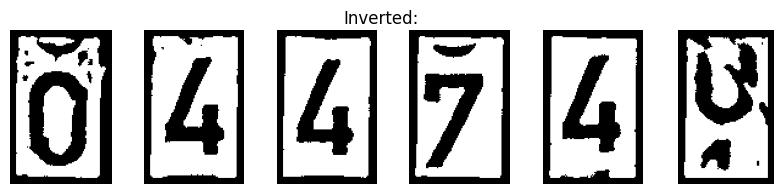

In [196]:
# invert the image into white background, black text, easier for tesseract to recognize
inverted_char_images = [cv2.bitwise_not(img) for img in char_images]

plt.figure(figsize=(10, 2))
for i in range(len(inverted_char_images)):
    plt.subplot(1, len(inverted_char_images), i + 1)
    plt.imshow(inverted_char_images[i], cmap='gray')
    plt.axis('off')
plt.suptitle('Inverted:')
plt.show()


#### Recoginize Numbers
For tesseract, it needs to recognize digit one by one (block by block).

But in the for loop, I set the code to output the digit in one line.

Error handling: if one image cannot be detected, return 'N' for that position.

In [197]:
custom_config = r'--oem 3 --psm 10 -c tessedit_char_whitelist=0123456789'

result_digits_1 = ""

for img in inverted_char_images:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    text = pytesseract.image_to_string(img_rgb, config=custom_config).strip()


    if text.isdigit() and len(text) == 1:
        result_digits_1 += text
    else:
        result_digits_1 += "N"

print(f"numercial digits: {result_digits_1}")


numercial digits: 04474N


For sample_data (15), last digit is unable to read, so it returns N for that digit.

Then I tried opencv template match to deal with the unreadable digital

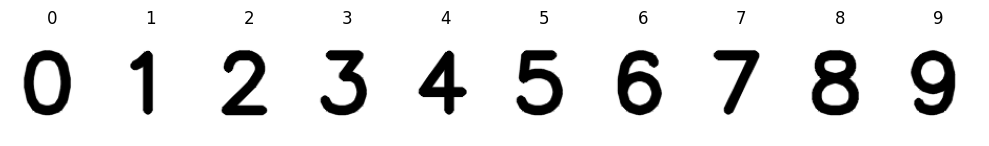

In [198]:
output_dir = "templates"
os.makedirs(output_dir, exist_ok=True)

font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 2.5
thickness = 7

for digit in range(10):
    img = np.ones((100, 80), dtype=np.uint8) * 255
    cv2.putText(img, str(digit), (10, 75), font, font_scale, (0,), thickness, lineType=cv2.LINE_AA)

    cv2.imwrite(os.path.join(output_dir, f"{digit}.png"), img)


plt.figure(figsize=(10, 2))
for i in range(10):
    img_path = os.path.join(output_dir, f"{i}.png")
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    plt.subplot(1, 10, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(str(i))
    plt.axis('off')
plt.tight_layout()
plt.show()


In [199]:
template_dir = "templates"
templates = {}
for fname in os.listdir(template_dir):
    digit = os.path.splitext(fname)[0]
    template_img = cv2.imread(os.path.join(template_dir, fname), cv2.IMREAD_GRAYSCALE)
    templates[digit] = template_img

custom_config = r'--oem 3 --psm 10 -c tessedit_char_whitelist=0123456789'

result_digits_2 = ""

for idx, img in enumerate(inverted_char_images):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    text = pytesseract.image_to_string(img_rgb, config=custom_config).strip()

    if text.isdigit() and len(text) == 1:
        result_digits_2 += text
    else:
        best_score = 0
        best_match = "N"
        for digit, tmpl in templates.items():
            resized_img = cv2.resize(img, tmpl.shape[::-1])
            res = cv2.matchTemplate(resized_img, tmpl, cv2.TM_CCOEFF_NORMED)
            _, score, _, _ = cv2.minMaxLoc(res)
            if score > best_score:
                best_score = score
                best_match = digit

        if best_score > 0.1:
            result_digits_2 += best_match
        else:
            result_digits_2 += "N"

print(f"result_digits_2: {result_digits_2}")

result_digits_2: 044749


It matched 9 for 0, which it's not correct.
So I'll keep the original one 'result_digits_1'.

### Step 2: Current total flow_2

*0.1 circle dial


#### Extract and Rotate

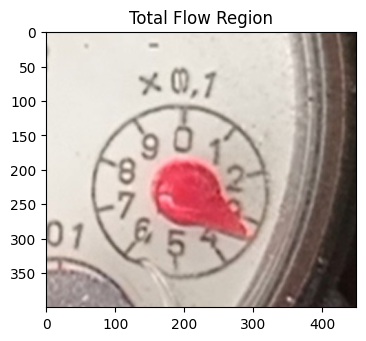

In [200]:
# Roughly extract from original image
totalflow_region_2 = img15[1000:1400, 2300:2750]

totalflow_rgb = cv2.cvtColor(totalflow_region_2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

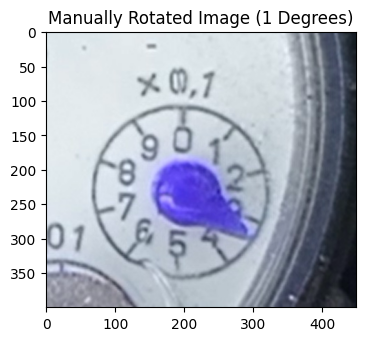

In [201]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_2, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degrees)')
plt.show()

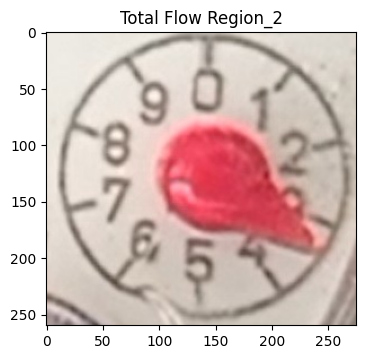

In [202]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_2 = rotated_img[105:365, 55:330]

totalflow_rgb_2 = cv2.cvtColor(totalflow_region_2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_2)
plt.title('Total Flow Region_2')
plt.show()

#### Process the extracted image
The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.



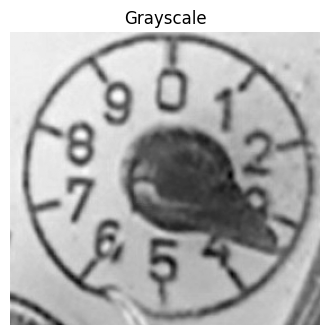

In [203]:
#gray scale
img = totalflow_region_2.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()

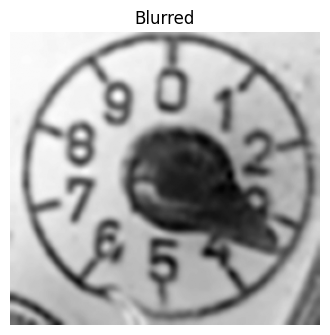

In [204]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

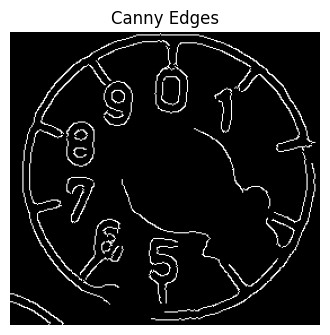

In [205]:
# detect edge
edges = cv2.Canny(blurred, 50, 150)

plt.figure(figsize=(4, 4))
plt.imshow(edges, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')
plt.show()

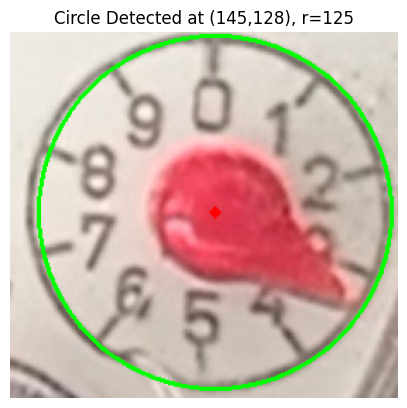

In [206]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[1028.]
 [ 691.]
 [ 624.]
 [ 622.]
 [ 844.]
 [ 838.]
 [ 951.]
 [ 654.]
 [1963.]
 [1242.]]
Mask stats:
[  0 255]


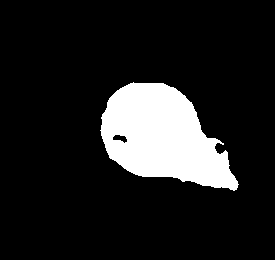

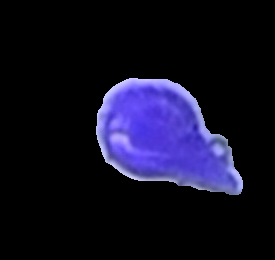

In [207]:
# Detect dial hand: find and enhance red color
hsv = cv2.cvtColor(totalflow_rgb_2, cv2.COLOR_RGB2HSV)

hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])

# find the red area
mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2

print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

# enhance the red area
kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_2, totalflow_rgb_2, mask=mask)

# visualize
cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()



#### Read the number on dial

Find the center of the red area, draw a line from the center of the circle to center of the red area, as the clock hand.

Then calculate the angle between the line and the horizon line. Convert the angle into number on dial.

116.56505117707799
Angle: 116.57°
Number on dial: 3


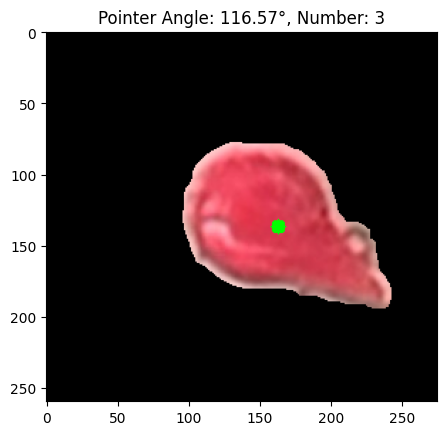

In [208]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

# find the outline of the red area
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
max_contour = max(contours, key=cv2.contourArea)

# find the center of red area
M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0

# show center of red area by green point
cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)

# calculate the angle of clock hand
cx_center, cy_center = 145, 128

# calculate the angle
dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg =90+ math.degrees(angle)

print(angle_deg)


# convert the angle into numbers
# Because there're 9 numbers on the dial, so every interval has 36 degree
num_value_1 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_1}")

# visualize
plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_1}")
plt.show()

### Step 3: Current total flow_3

*0.01 circle dial

#### Extract and Rotate

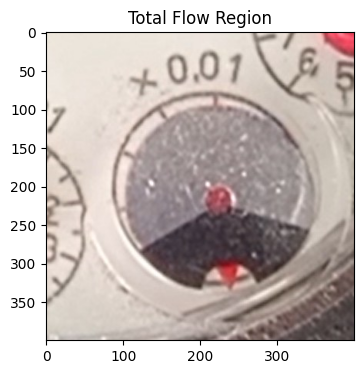

In [209]:
# Roughly extract from original image
totalflow_region_3 = img15[1250:1650, 2100:2500]

totalflow_rgb = cv2.cvtColor(totalflow_region_3, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

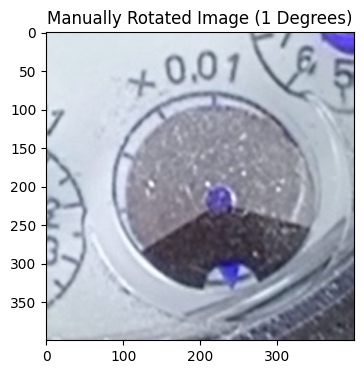

In [210]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_3, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degrees)')
plt.show()

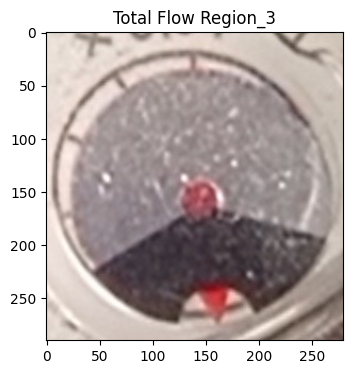

In [211]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_3 = rotated_img[60:350, 80:360]

totalflow_rgb_3 = cv2.cvtColor(totalflow_region_3, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_3)
plt.title('Total Flow Region_3')
plt.show()

#### Process the etracted image
The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.


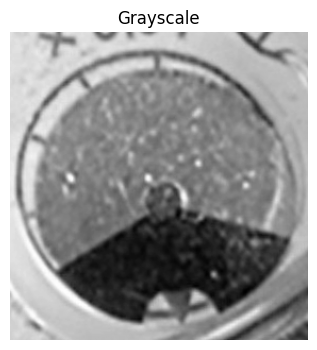

In [212]:
#gray scale
img = totalflow_region_3.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()

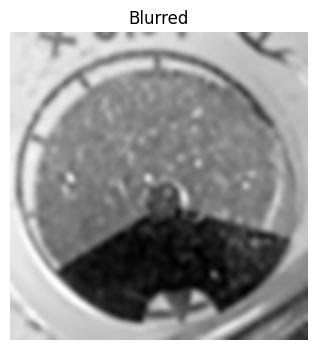

In [213]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

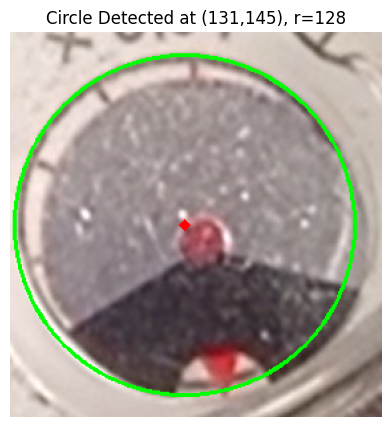

In [214]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[8990.]
 [ 435.]
 [1856.]
 [3973.]
 [ 836.]
 [4443.]
 [2448.]
 [1236.]
 [3242.]
 [4431.]]
Mask stats:
[  0 255]


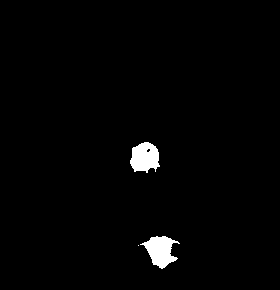

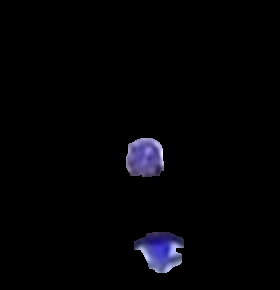

In [215]:
# Detect dial hand: find and enhance red color
hsv = cv2.cvtColor(totalflow_rgb_3, cv2.COLOR_RGB2HSV)


hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])


mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2


print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_3, totalflow_rgb_3, mask=mask)


cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### Read the number on dial

164.56035446468076
Angle: 164.56°
Number on dial: 4


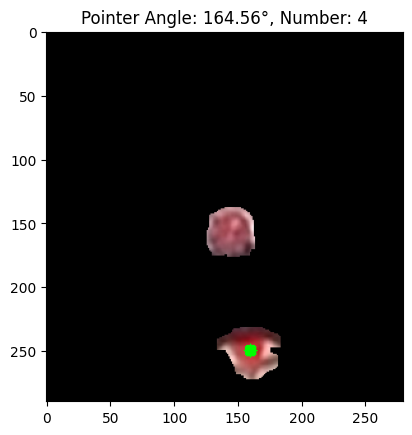

In [216]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
max_contour = max(contours, key=cv2.contourArea)

M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0


cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)


cx_center, cy_center = 131, 145


dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg = 90+ math.degrees(angle)

print(angle_deg)

num_value_2 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_2}")

plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_2}")
plt.show()

### Step 4: Current total flow_4

*0.001 circle dial

#### Extract and Rotate

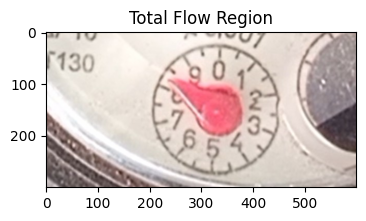

In [217]:
# Roughly extract from original image
totalflow_region_4 = img15[1350:1650, 1700:2300]

totalflow_rgb = cv2.cvtColor(totalflow_region_4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

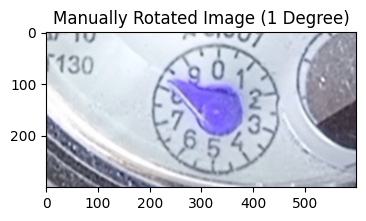

In [218]:
# Rotate the image
def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)

    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    return rotated

rotated_img = rotate_image(totalflow_region_4, 1)

plt.figure(figsize=(4, 4))
plt.imshow(rotated_img, cmap='gray')
plt.title('Manually Rotated Image (1 Degree)')
plt.show()

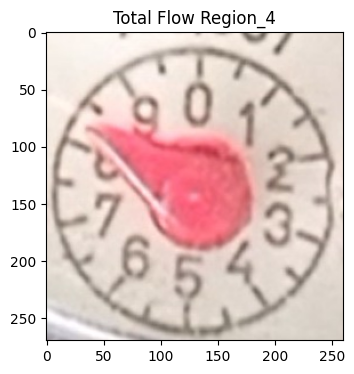

In [219]:
# Extract again after rotated, make sure only current total flow inside the image
totalflow_region_4 = rotated_img[10:280, 200:460]

totalflow_rgb_4 = cv2.cvtColor(totalflow_region_4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(4, 4))
plt.imshow(totalflow_rgb_4)
plt.title('Total Flow Region_4')
plt.show()

#### Process the etracted image

The basic idea of detecting numbers in circle dial is to find the circle outline, find the center of the circle, find the dial hand and calculate the angle of the hand.

So in order to get these information, need to convert into gray scale, denoise, enhance the outline, find and enhance the red color of dial hand, etc.

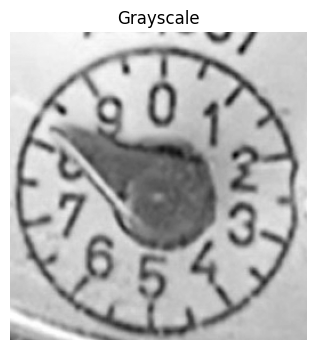

In [220]:
#gray scale
img = totalflow_region_4.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale')
plt.axis('off')
plt.show()

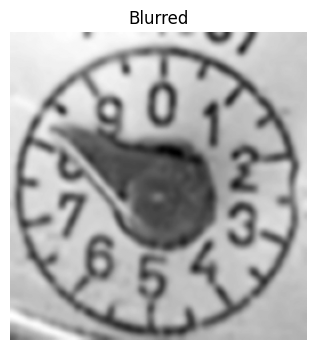

In [221]:
# Denoise
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

plt.figure(figsize=(4, 4))
plt.imshow(blurred, cmap='gray')
plt.title('Blurred')
plt.axis('off')
plt.show()

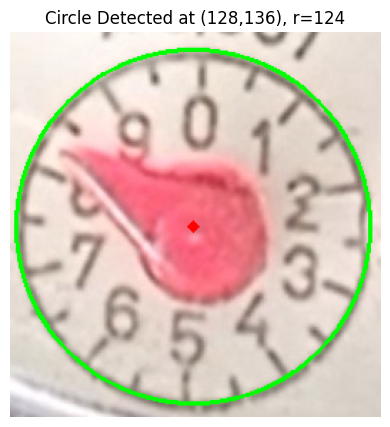

In [222]:
# detect circle dial
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                           param1=50, param2=30, minRadius=80, maxRadius=150)

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles[:1]:
        output = img.copy()
        cv2.circle(output, (x, y), r, (0, 255, 0), 2)
        cv2.circle(output, (x, y), 2, (0, 0, 255), 3)

        plt.figure(figsize=(5, 5))
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
        plt.title(f'Circle Detected at ({x},{y}), r={r}')
        plt.axis('off')
        plt.show()
else:
    print("cannot detect circle dial")


[[ 835.]
 [ 573.]
 [ 591.]
 [ 578.]
 [ 717.]
 [ 821.]
 [1347.]
 [1108.]
 [2386.]
 [2541.]]
Mask stats:
[  0 255]


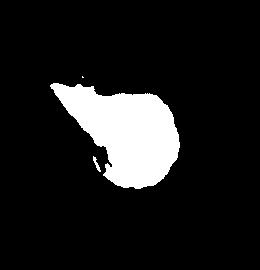

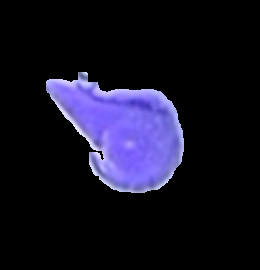

In [223]:
# Detect dial hand: find and enhance red color
from google.colab.patches import cv2_imshow

hsv = cv2.cvtColor(totalflow_rgb_4, cv2.COLOR_RGB2HSV)

hist = cv2.calcHist([hsv], [0], None, [256], [0, 256])
print(hist[:10])

lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])

lower_red2 = np.array([170, 100, 100])
upper_red2 = np.array([180, 255, 255])

mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = mask1 | mask2

print("Mask stats:")
print(np.unique(mask))

cv2_imshow(mask)
cv2.waitKey(0)

kernel = np.ones((5, 5), np.uint8)
mask = cv2.dilate(mask, kernel, iterations=2)

red_area = cv2.bitwise_and(totalflow_rgb_4, totalflow_rgb_4, mask=mask)

cv2_imshow(red_area)
cv2.waitKey(0)
cv2.destroyAllWindows()

#### Read the number on dial

315.0
Angle: 315.00°
Number on dial: 8


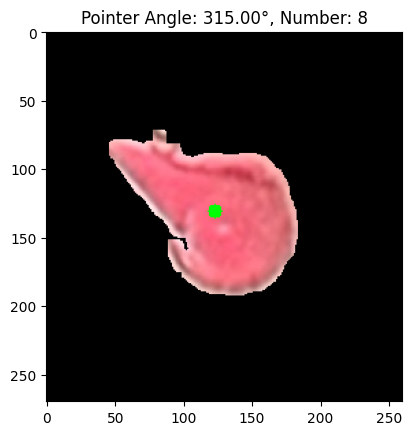

In [225]:
gray = cv2.cvtColor(red_area, cv2.COLOR_RGB2GRAY)
_, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

max_contour = max(contours, key=cv2.contourArea)

M = cv2.moments(max_contour)
if M["m00"] != 0:
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
else:
    cx, cy = 0, 0


cv2.circle(red_area, (cx, cy), 5, (0, 255, 0), -1)


cx_center, cy_center = 128, 136

dx = cx - cx_center
dy = cy - cy_center
angle = math.atan2(dy, dx)

angle_deg = 450+ math.degrees(angle)

print(angle_deg)

num_value_3 = int(angle_deg // 36)

print(f"Angle: {angle_deg:.2f}°")
print(f"Number on dial: {num_value_3}")

plt.imshow(red_area)
plt.title(f"Pointer Angle: {angle_deg:.2f}°, Number: {num_value_3}")
plt.show()

### Step 5: Timestamp

#### Extract
Because the timestamp is already horizonal, so no need for rotating.

In [226]:
print(img15.shape)

(2160, 3840, 3)


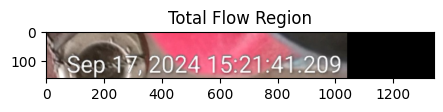

In [228]:
totalflow_region = img15[2000:2160, 2500:3840]

totalflow_rgb = cv2.cvtColor(totalflow_region, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5, 4))
plt.imshow(totalflow_rgb)
plt.title('Total Flow Region')
plt.show()

#### Process the extracted image to augment the text
Because the color in background is too noisy, so need to focus on augmenting the text.

Included: transform to gray-scale, ehnace, sharpening, binary and inverted.

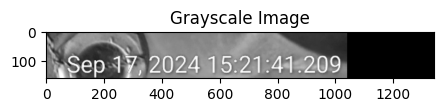

In [229]:
# transform to grey-scale
gray = cv2.cvtColor(totalflow_region, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(5, 4))
plt.imshow(gray, cmap='gray')
plt.title('Grayscale Image')
plt.show()

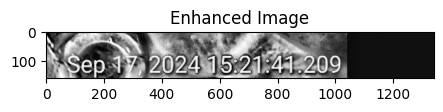

In [230]:
# Enhance the image
clahe = cv2.createCLAHE(clipLimit=15.0, tileGridSize=(8, 8))
enhanced = clahe.apply(gray)

plt.figure(figsize=(5, 4))
plt.imshow(enhanced, cmap='gray')
plt.title('Enhanced Image')
plt.show()

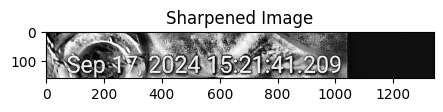

In [231]:
# Sharpening using kernel

kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
sharpened = cv2.filter2D(enhanced, -1, kernel)

plt.figure(figsize=(5, 4))
plt.imshow(sharpened, cmap='gray')
plt.title('Sharpened Image')
plt.show()

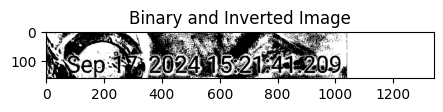

In [232]:
# Binary and inverted the image
_, binary = cv2.threshold(sharpened, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
inverted = cv2.bitwise_not(binary)

plt.figure(figsize=(5, 4))
plt.imshow(inverted, cmap='gray')
plt.title('Binary and Inverted Image')
plt.show()

#### Recognize the text

With prior experience, for sample data (4) timestamp extracting, I'll try the advance method PaddleOCR directly. Also, the inverted image is vaguer than sharpened one. So I'll use sharpened image for recognization.

In [239]:
# try advance method directly: PaddleOCR + regularization, using the sharpend image
ocr = PaddleOCR(use_angle_cls=True, lang='en')

if len(sharpened.shape) == 2:
    sharpened_bgr = cv2.cvtColor(sharpened, cv2.COLOR_GRAY2BGR)
else:
    sharpened_bgr = sharpened

result = ocr.ocr(sharpened_bgr, cls=True)

for line in result[0]:
    text = line[1][0]
    confidence = line[1][1]

    formatted_text = re.sub(r'(\b[Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec]{3})\s*(\d{1,2})\.(\d{4})\s*(\d{2}):(\d{2}):(\d{2}\.\d{3})', r'\1 \2.\3 \4:\5:\6', text)

    print(f"text: {formatted_text}, confidence: {confidence:.2f}")

text: Sep 17.2024 15:21:41.209, confidence: 0.96


It can read the content correctly. So no need for further process.

### Step 6: Output the data

In [240]:
# Combine the total current flow as a new string
# Current total flow=current total flow_1+ 0.1 *current total flow_2+0.01 *current total flow_3+0.001 *current total flow_4
# Add decimal point after the current total flow_1, and append current total flow_2, current total flow_3, current total flow_4 (convert into str format)
final_result = result_digits_1 + "." + str(num_value_1)+ str(num_value_2)+ str(num_value_3)

print(final_result)

04474N.348


#### Output in csv file

In [241]:
output_path = '/content/drive/MyDrive/data_extracting_assessment_outputs/output_sample_15.csv'

df = pd.DataFrame({
    'current_total_flow': [final_result],
    'timestamp': [formatted_text]
})

os.makedirs(os.path.dirname(output_path), exist_ok=True)
df.to_csv(output_path, mode='w', index=False, header=not os.path.exists(output_path))

#### Output in annoted image

I copied the original image and annoted the current total flow and timestamp next to the text on image.

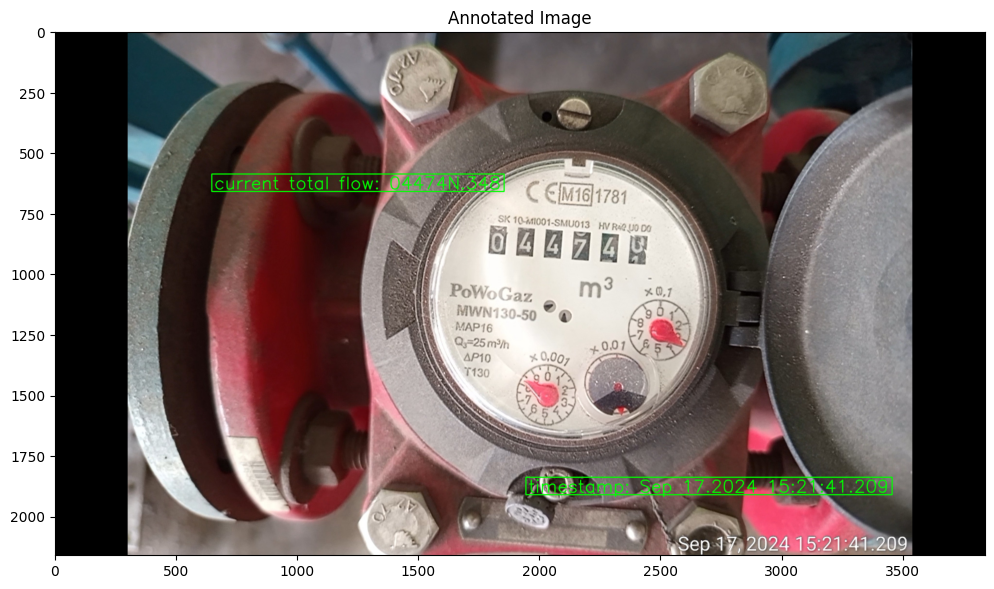

In [243]:
# read original image and make a copy
img1 = cv2.imread('/content/drive/MyDrive/sample_data/sample_data (15).jpg')
copy_img1 = img1.copy()

# prepare annotation texts
flow_text = f"current total flow: {final_result}"
timestamp_text = f"timestamp: {formatted_text}"

# set font style and color: green
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 2.4
font_thickness = 4
font_color = (0, 255, 0)
rectangle_color = (0, 255, 0)

# helper function to draw text with bounding box
def draw_text_with_box(img, text, x_range, y_range):
    x_center = (x_range[0] + x_range[1]) // 2
    y_center = (y_range[0] + y_range[1]) // 2

    # calculate text size
    (text_width, text_height), baseline = cv2.getTextSize(text, font, font_scale, font_thickness)

    # compute top-left corner of text to center it inside the region
    top_left_x = x_center - text_width // 2
    top_left_y = y_center - text_height // 2

    # draw rectangle box slightly larger than text
    cv2.rectangle(img,
                  (top_left_x - 10, top_left_y - 10),
                  (top_left_x + text_width + 10, top_left_y + text_height + 10),
                  rectangle_color, 4)

    # put text inside the rectangle
    cv2.putText(img, text,
                (top_left_x, top_left_y + text_height),
                font, font_scale, font_color, font_thickness)

# ----- annotate current_total_flow -----
# region: x 1000-1500,  y 500-750
draw_text_with_box(copy_img1, flow_text, x_range=(1000, 1500), y_range=(500, 750))

# ----- annotate timestamp -----
# region: x 2200-3200, y 1750-2000
draw_text_with_box(copy_img1, timestamp_text, x_range=(2200, 3200), y_range=(1750, 2000))

# ----- save and visualize output -----
output_path = '/content/drive/MyDrive/data_extracting_assessment_outputs/output_sample_15.jpg'
cv2.imwrite(output_path, copy_img1)

# visualize in notebook
img_rgb = cv2.cvtColor(copy_img1, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(12, 10))
plt.imshow(img_rgb)
plt.title("Annotated Image")
plt.axis('on')
plt.show()
